In [4]:
import importlib, sys, modelUtils
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import linear_model, svm
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.kernel_ridge import KernelRidge
from sklearn.multioutput import MultiOutputRegressor
from sklearn.neural_network import MLPRegressor
from scipy.optimize import curve_fit

import sklearn.linear_model

In [137]:
importlib.reload(modelUtils)

<module 'modelUtils' from '/eos/home-i00/l/lgolino/SWAN_projects/GaussianConvolutionTest/modelUtils.py'>

In [124]:
fileloc = '/eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TestingDataV2/files/results/'
bin_width = 0.02/400 #This must be set at the same value you used in the data extraction. 
append = 'FirstAttempt' #This is to be used as the 'tag' for this run.
#Pull metadata
metadata = pd.read_csv(fileloc + '../' + 'data.csv')

In [125]:
metadata

,Unnamed: 0,Configuration filename,Beams/Beam[0]/Parameters/BunchPopulation,Beams/Beam[0]/BunchShape/Parameters/LongitudinalSigmaLabFrame,Beams/Beam[0]/BunchShape/Parameters/TransverseSigma,Simulation/Output/Parameters/Filename,Beams/Beam[0]/Parameters/Energy,Beams/Beam[0]/BunchTrain/LongitudinalOffset,Beams/Beam[0]/BunchTrain/TransverseOffset,GuidingFields/Electric/Parameters/ElectricField,GuidingFields/Magnetic/Parameters/MagneticField,Simulation/NumberOfParticles
0,0,0000.xml,1.2,1.0,[850.0 800.0],0000.csv,25.445,NaN,[0. 0.],286,0.01,3000000
1,1,0001.xml,1.2,1.0,[852.0408163265306 800.0],0001.csv,25.445,NaN,[0. 0.],286,0.01,3000000
2,2,0002.xml,1.2,1.0,[854.0816326530612 800.0],0002.csv,25.445,NaN,[0. 0.],286,0.01,3000000
3,3,0003.xml,1.2,1.0,[856.1224489795918 800.0],0003.csv,25.445,NaN,[0. 0.],286,0.01,3000000
4,4,0004.xml,1.2,1.0,[858.1632653061224 800.0],0004.csv,25.445,NaN,[0. 0.],286,0.01,3000000
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4995,4995.xml,1.4,1.1,[941.8367346938776 800.0],4995.csv,25.445,NaN,[0. 0.],286,0.01,3000000
4996,4996,4996.xml,1.4,1.1,[943.8775510204082 800.0],4996.csv,25.445,NaN,[0. 0.],286,0.01,3000000
4997,4997,4997.xml,1.4,1.1,[945.9183673469388 800.0],4997.csv,25.445,NaN,[0. 0.],286,0.01,3000000
4998,4998,4998.xml,1.4,1.1,[947.9591836734694 800.0],4998.csv,25.445,NaN,[0. 0.],286,0.01,3000000


WARNING: FOLLOWING CELLS WILL RESET DATA EXTRACTION. DO NOT SAVE TO SAME PICKLE FILE UNLESS YOU ARE HAPPY OVERWRITING THAT PICKLE.

In general it would be good practive to change the filenames before you rerun these again. For example changing the "append" string in method 2 will save the new files you create to a differently names pickle. Same with the "name" variable in method 3.

# There are 3 methods of data extraction owing to the way data taking evolved over the course of this work. This really needs to be standardised.

## Method 1:

The following extracts the data in a `limit*number_of_variables` shaped matrix. Where each variable is that defined in DataExtraction. The complete extraction here is unfinished. This would be a cleanest and best way to extract the data but it isn't finished yet

In [36]:
data = modelUtils.import_data_as_vector(metadata, fileloc, index_of_file=5, limit=50)

Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/00000.csv.pkl.gz
Finished: Total =  51


The columns here must match those in the DataExtraction

In [9]:
df = pd.DataFrame(data, columns=['real_stddev', 'bins', 'real_profile_hist', 'bins2_max', 'distorted_profile_hist_max',
                 'distorted_profile_hist_5k', 'distorted_profile_hist_10k', 'distorted_profile_hist_25k',
                 'distorted_profile_hist_50k', 'distorted_profile_hist_100k', 'distorted_profile_hist_200k',
                 'distorted_profile_hist_500k', 'distorted_profile_hist_1mil'])
df

,real_stddev,bins,real_profile_hist,bins2_max,distorted_profile_hist_max,distorted_profile_hist_5k,distorted_profile_hist_10k,distorted_profile_hist_25k,distorted_profile_hist_50k,distorted_profile_hist_100k,distorted_profile_hist_200k,distorted_profile_hist_500k,distorted_profile_hist_1mil
0,0.000600,"[-0.01, -0.00995, -0.0099, -0.00985, -0.0098, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[-0.01, -0.00995, -0.0099, -0.00985, -0.0098, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, ..."
1,0.000600,"[-0.01, -0.00995, -0.0099, -0.00985, -0.0098, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[-0.01, -0.00995, -0.0099, -0.00985, -0.0098, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
2,0.000600,"[-0.01, -0.00995, -0.0099, -0.00985, -0.0098, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[-0.01, -0.00995, -0.0099, -0.00985, -0.0098, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ..."
3,0.000600,"[-0.01, -0.00995, -0.0099, -0.00985, -0.0098, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[-0.01, -0.00995, -0.0099, -0.00985, -0.0098, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,0.000600,"[-0.01, -0.00995, -0.0099, -0.00985, -0.0098, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[-0.01, -0.00995, -0.0099, -0.00985, -0.0098, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
5,0.000600,"[-0.01, -0.00995, -0.0099, -0.00985, -0.0098, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[-0.01, -0.00995, -0.0099, -0.00985, -0.0098, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[

In [82]:
#This is unfinished.
#But here it would look something like:
#X = df['distorted_profile_hist_max'].flatten()
#y = df['real_stddev'] or df['real_profile_hist']

## Method 2:

This will only work if you know how many variables you saved (ie which version of DataExtraction.py was used during these runs). This is used for the more recent ones where I started saving more histograms (sometimes up to 13 variables are saved to the pickle file). You may need to play with "import_testing_data()" or "convert_testing_data_to_df()" to get it to fit your data. I think I already have options in there for if you have saved 12/13 variables but no other values.
This however will pull and save all profiles you have designated. 5k-3mil. You might have to change the index_of_file variable especially if the "FAILED:" line doesn't say "FAILED: xxx.csv" look at the correct index in the metadata dataframe.

In [143]:
#Also be careful of the order here, sometimes the max is at the beggining of the unpack, sometimes its at the end.
real_x_stddevs, real_x_hists, distorted_x_hists_3mil, distorted_x_hists_5k, distorted_x_hists_10k, \
           distorted_x_hists_25k, distorted_x_hists_50k, distorted_x_hists_100k, distorted_x_hists_200k, \
           distorted_x_hists_500k, distorted_x_hists_1mil = modelUtils.import_testing_data(metadata, fileloc, index_of_file=5, limit=1000)

real_profiles, real_stddev, distorted_profiles_5k, distorted_profiles_10k, distorted_profiles_25k, \
           distorted_profiles_50k, distorted_profiles_100k, distorted_profiles_200k, distorted_profiles_500k, \
           distorted_profiles_1mil, distorted_profiles_3mil = modelUtils.convert_testing_data_to_df(real_x_stddevs, real_x_hists, distorted_x_hists_3mil, distorted_x_hists_5k, distorted_x_hists_10k, \
           distorted_x_hists_25k, distorted_x_hists_50k, distorted_x_hists_100k, distorted_x_hists_200k, \
           distorted_x_hists_500k, distorted_x_hists_1mil)


modelUtils.save_to_pickle(metadata, fileloc+'../', real_profiles, real_stddev, distorted_profiles_5k, append='5k')
modelUtils.save_to_pickle(metadata, fileloc+'../', real_profiles, real_stddev, distorted_profiles_10k, append='10k')
modelUtils.save_to_pickle(metadata, fileloc+'../', real_profiles, real_stddev, distorted_profiles_25k, append='25k')
modelUtils.save_to_pickle(metadata, fileloc+'../', real_profiles, real_stddev, distorted_profiles_50k, append='50k')
modelUtils.save_to_pickle(metadata, fileloc+'../', real_profiles, real_stddev, distorted_profiles_100k, append='100k')
modelUtils.save_to_pickle(metadata, fileloc+'../', real_profiles, real_stddev, distorted_profiles_200k, append='200k')
modelUtils.save_to_pickle(metadata, fileloc+'../', real_profiles, real_stddev, distorted_profiles_500k, append='500k')
modelUtils.save_to_pickle(metadata, fileloc+'../', real_profiles, real_stddev, distorted_profiles_1mil, append='1mil')
modelUtils.save_to_pickle(metadata, fileloc+'../', real_profiles, real_stddev, distorted_profiles_3mil, append='3mil')

Opening  0000.csv
FAILED:  0002.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
FAILED:  0006.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
FAILED:  0016.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
FAILED:  0021.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
FAILED:  0024.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
FAILED:  0070.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
FAILED:  0081.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
FAILED:  0087.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
FAILED:  0094.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
Opening  0100.csv
FAILED:  0116.csv
This one d

## Method 3:

This is what I was using for a while, it checks the number of variables and has options for 5, 6, 13 which I have used in the past, but it only keeps three too pass on and discard the rest those being the "real_x_stddevs" which are the beam widths of the initial position of the particles. "real_x_hists" which are the histograms of the profiles before distortion, and "distorted_x_hists" which are the profiles after.

In [81]:
modelUtils.import_and_save(metadata, fileloc, name='_test1', limit=-1, index_of_file=5)

Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/00000.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/00100.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/00200.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/00300.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/00400.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/00500.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/00600.csv.pkl.gz
FAILED:  00622.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/00700.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/V

Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/07400.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/07500.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/07600.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/07700.csv.pkl.gz
FAILED:  07714.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
FAILED:  07723.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
FAILED:  07734.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
FAILED:  07737.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
FAILED:  07739.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
FAILED:  07742.csv
This one didnt work, likely a condor

Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/11700.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/11800.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/11900.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/12000.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/12100.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/12200.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/12300.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/12400.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/12500.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/V

Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/19400.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/19500.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/19600.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/19700.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/19800.csv.pkl.gz
Opening  /eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/results/19900.csv.pkl.gz
FAILED:  19938.csv
This one didnt work, likely a condor error. If some of your jobs didnt run, its fine.
Finished: Total =  20000
All three of your training data sizes are good. You may continue.
All data saved to pickle with the suffix _test1


END OF WARNING. EVERYTHING BELOW IS SAFE TO RUN WITHOUT WIPING ANY DATA.

Above cell is the preprocessing of the data. Once this data is safely and correctly stored in the pickle files we shouldn't need to perform any of the above steps again. It is saved as real and distorted data. It is only after we pull the data into python below specifically for training does it become the traditional x, y data as usually seen in ML literature.

In [114]:
#X, ystddev, yhists = modelUtils.load_from_pickle(fileloc, append, True) #Method 1
X, ystddev, yhists = modelUtils.load_from_pickle(fileloc+'../', '3mil', False) #Method 2
X, ystddev, yhists = modelUtils.load_from_pickle(fileloc, '_test1', True) #method 3

X

,0,1,2,3,4,5,6,7,8,9,...,390,391,392,393,394,395,396,397,398,399
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
19996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
19997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
19998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


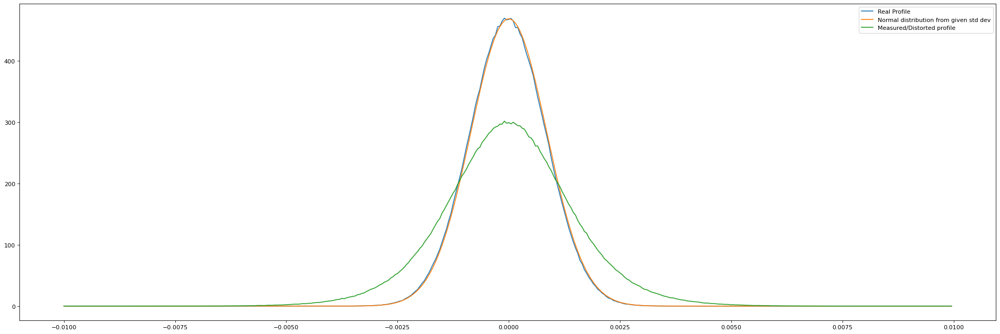

In [85]:
modelUtils.plot_profile(X, ystddev, yhists, bin_width, 13)

In [116]:
#If you would like to convert to metres now is the time to do so.
#ystddev = ystddev*1e6
#Also convert the profiles to percentages, this should allow you to apply it to profiles with any number of hits as long as they are also normalised.
X = modelUtils.normalise_profile_percent(X)
yhists = modelUtils.normalise_profile_percent(yhists)

In [117]:
#Split into train and test data. Shuffling here is important because if you use a range of values in V-IPM then the while last 20% of the set may have
#different beam parameters than the first 80%. Keeping the state consistent is important though.
X_train, X_test = train_test_split(X, test_size=0.2, shuffle=True, random_state=1)
y_train_stddev, y_test_stddev = train_test_split(ystddev, test_size=0.2, shuffle=True, random_state=1)
y_train_profile, y_test_profile = train_test_split(yhists, test_size=0.2, shuffle=True, random_state=1)
#y_train_profile # Just to see

Chose and train the model. For now lets stick to one. 
Now we can train the model(s). These all have the same variable name so just pick one and run that. Unfortunately things change below depenging on the model which is annoying. 

The following cell basically does it all for us. Creates the model, trains it, prints plots on the results. Just change the model here and see how the plots change. 

# LR Model:

Printing metrics about model 1 (std dev).
Mean squared error: 0.000000000000948 in um.
Coefficient of determination: 0.998863891326726
Score: 0.998907466087769 

Printing metrics about model 1 (std dev).
Mean squared error: 0.000009321576512 in um.
Coefficient of determination: 0.762795015170324


/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/base.py:412: FutureWarning: The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').
  warnings.warn("The default value of multioutput (not exposed in "


Score: 0.971542890389598 

SD: Manhattan distance between plots =  1.1384420147111376
SD: MS distance between plots =  6.411484787692371
SD: Chi2 goodness of fit: 17.62834198342584


FP: Manhattan distance between plots =  0.2195980970471995
FP: MS distance between plots =  0.3348225787293122
FP: Chi2 goodness of fit: 1.4810087484564372
Mean of the manhat distance between real and recon via SD approach: 1.121817951219371
MSE between real and recon via SD approach: 6.415926085667874
Mean of the manhat distance between real and recon via FP approach: 0.2326327584769529
MSE between real and recon via FP approach: 0.3726146257285728
                                                                                  mean of residuals    std of residuals    r2 score       MSE
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)             0.773856            0.591196    0.998864  0.948366
                                                                               

,From SD,From FP
16084,0.176311,0.191543
18949,0.018738,0.031253
12828,0.093419,0.093702
5906,0.170733,0.147060
17862,0.103277,0.102104
...,...,...
9716,0.109200,0.046637
7937,0.094671,0.030528
1676,0.008245,0.015609
18851,0.107126,0.146308


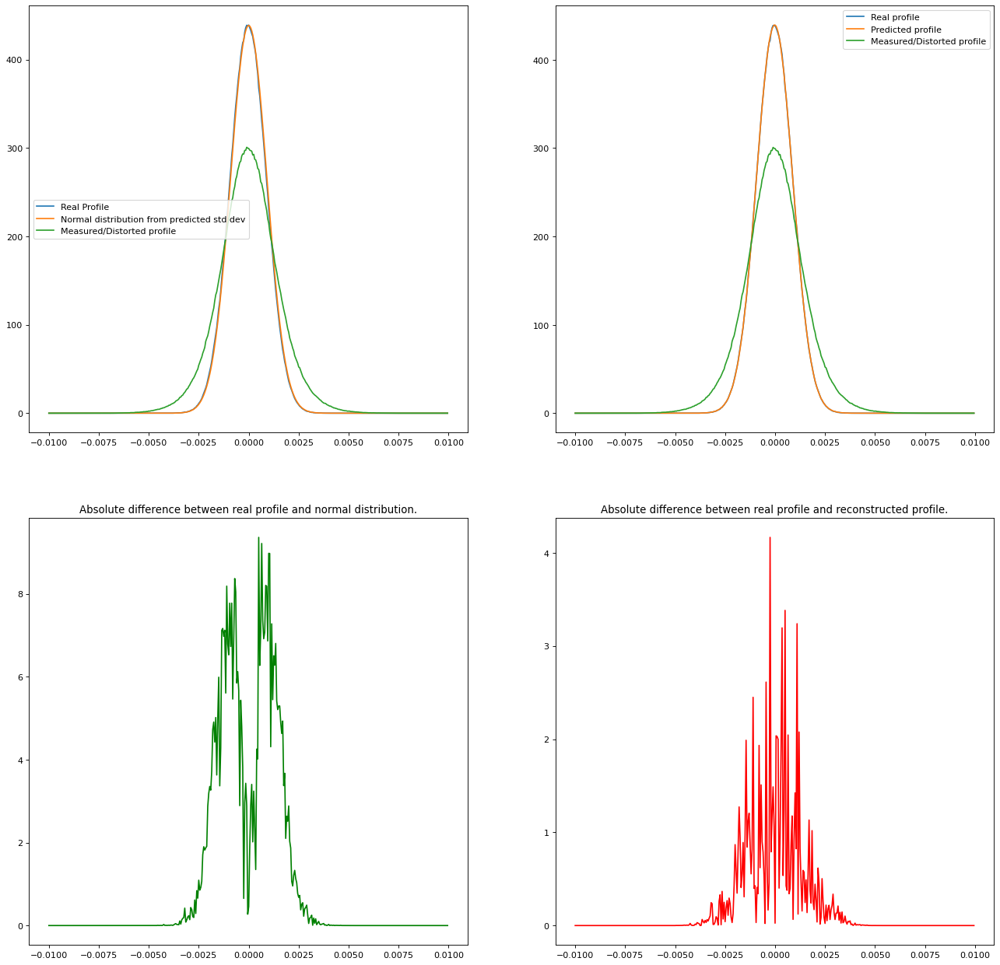

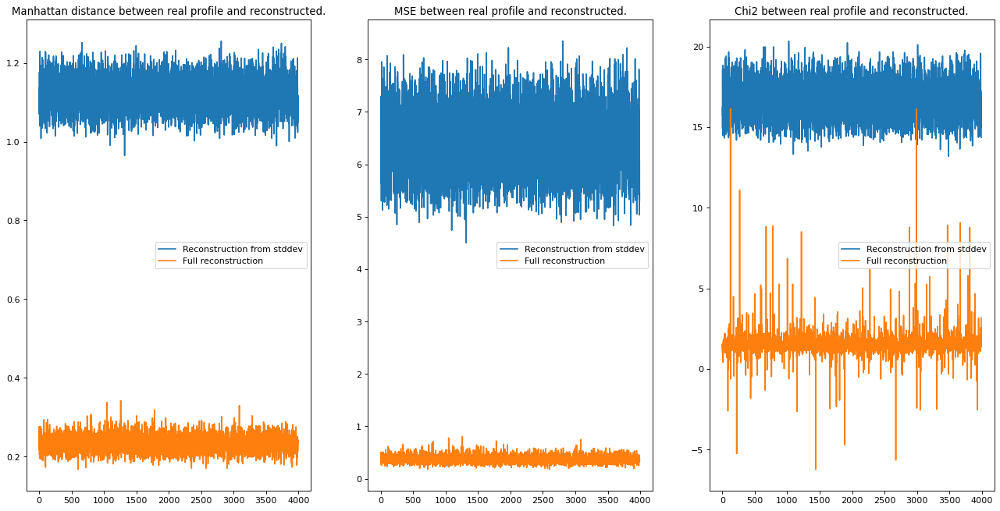

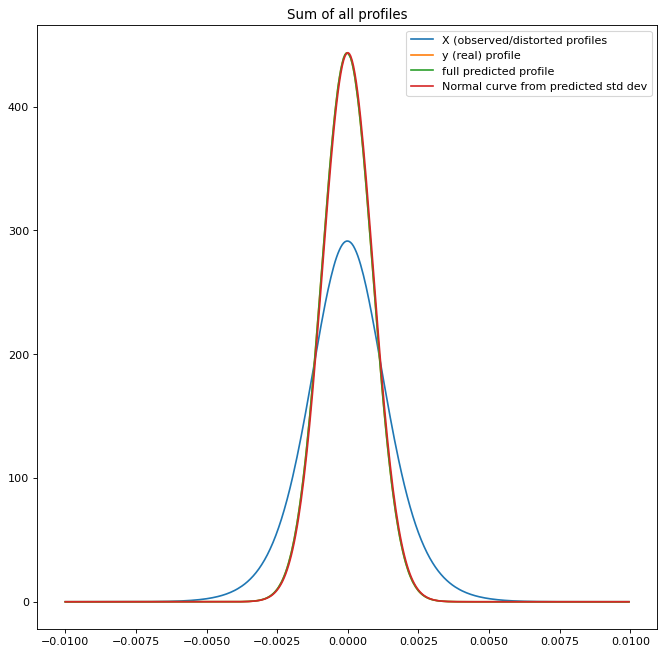

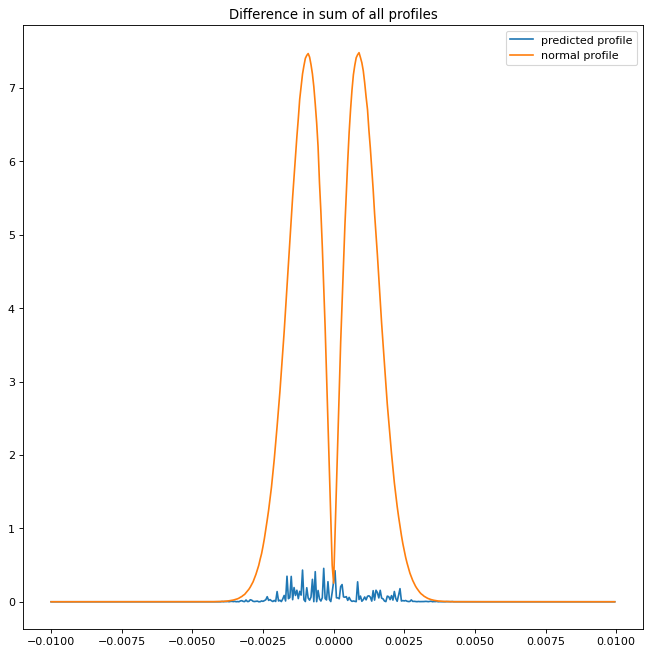

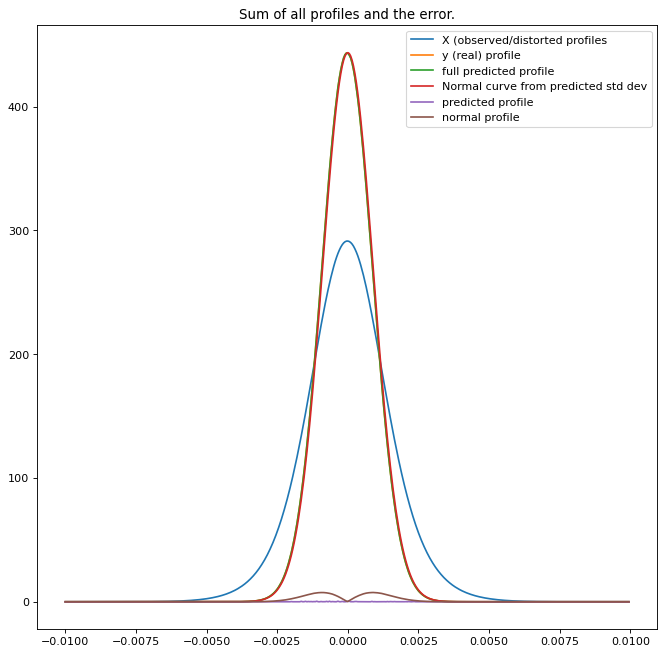

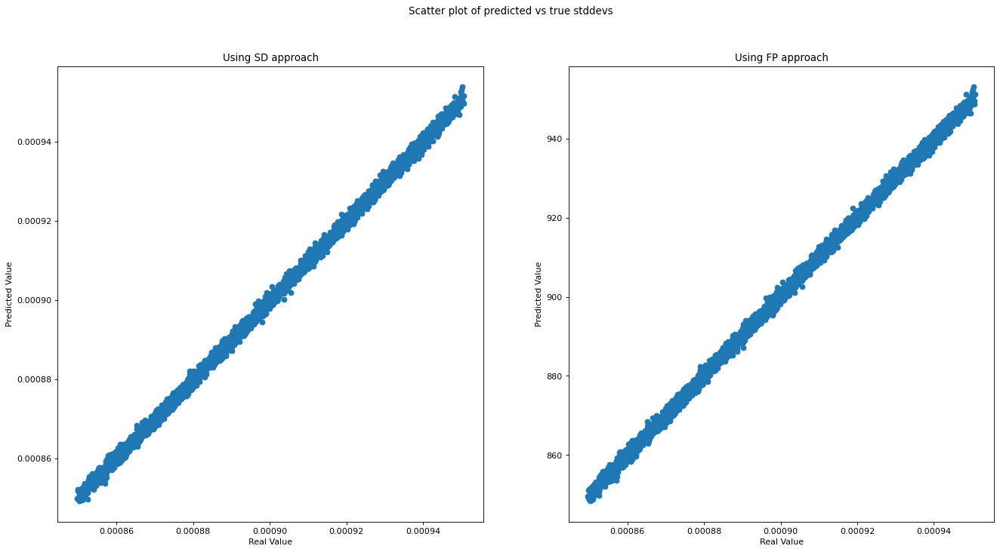

In [118]:
# Create KRR object and train on stddevs.
# Model 1
#KernelRidge(alpha=1, *, kernel='linear', gamma=None, degree=3, coef0=1, kernel_params=None)
regr_stddev = linear_model.LinearRegression(normalize = True)
regr_stddev.fit(X_train, y_train_stddev)
y_pred_stddev = regr_stddev.predict(X_test)

# Create linear regression object and train on full profile.
# Model 2
regr_profile = linear_model.LinearRegression(normalize = True)
regr_profile.fit(X_train, y_train_profile)
y_pred_profile = regr_profile.predict(X_test)

#Print metrics of each model.
modelUtils.print_model_metrics(X_train, y_train_stddev, X_test, y_test_stddev, regr_stddev)
modelUtils.print_model_metrics(X_train, y_train_profile, X_test, y_test_profile, regr_profile)

#Plot an example (index 10)
modelUtils.plot_example_recon(10, bin_width, X, y_test_profile, y_pred_profile, y_pred_stddev)

#Show the MSE, Manhat, and Chi2
modelUtils.print_error_plots(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

#Generate dataframe of normal profiles.
df = modelUtils.generate_normal_dataframe(bin_width, y_pred_stddev)

#Plot sums and sum of errors.
modelUtils.plot_sum(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)
modelUtils.plot_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)
modelUtils.plot_sum_and_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

#Rate model in format of copied paper.
modelUtils.rate_model_sd(y_test_stddev*1e6, y_pred_stddev*1e6, regr_stddev)
modelUtils.rate_model_sd(y_test_profile, y_pred_profile, regr_profile)

#Get residual dataframe.
residuals, stddev_from_profile = modelUtils.get_all_errors(bin_width, y_test_stddev, y_pred_stddev, y_pred_profile)

#Plot scatter of predictions
modelUtils.plot_scatters(y_test_stddev, y_pred_stddev, stddev_from_profile)

#Find % errors.
modelUtils.percent_errors(y_test_stddev, y_pred_stddev, stddev_from_profile)

# KRR Model:

/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

Printing metrics about model 1 (std dev).


/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

Mean squared error: 0.000000002382527 in um.
Coefficient of determination: 0.933510174351518


/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

Score: 0.929558896940075 

Printing metrics about model 1 (std dev).


/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

Mean squared error: 0.000933820397151 in um.
Coefficient of determination: 0.712842829873634


/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

Score: 0.928151288794182 

SD: Manhattan distance between plots =  5.894830258569173
SD: MS distance between plots =  147.95547735664184
SD: Chi2 goodness of fit: 488.61589989364506


FP: Manhattan distance between plots =  6.262029668144823
FP: MS distance between plots =  178.43065325743152
FP: Chi2 goodness of fit: 597.185269116072
Mean of the manhat distance between real and recon via SD approach: 2.1508476078636813
MSE between real and recon via SD approach: 46.34801171685496
Mean of the manhat distance between real and recon via FP approach: 1.849880227780108
MSE between real and recon via FP approach: 37.335056898322215
                                                                         mean of residuals    std of residuals    r2 score      MSE
KernelRidge(alpha=0.01, coef0=1, degree=2, gamma=None, kernel='poly',              29.4122             38.9544     0.93351  2382.53
            kernel_params=None)
                                                                     

,From SD,From FP
1615,4.665751,5.737860
108,0.197472,1.891074
3612,1.978132,3.621146
3031,2.432660,3.336327
3948,3.266921,3.603699
...,...,...
996,3.592500,4.276299
965,3.554803,3.873028
3057,1.176114,2.267223
1882,1.781193,1.945109


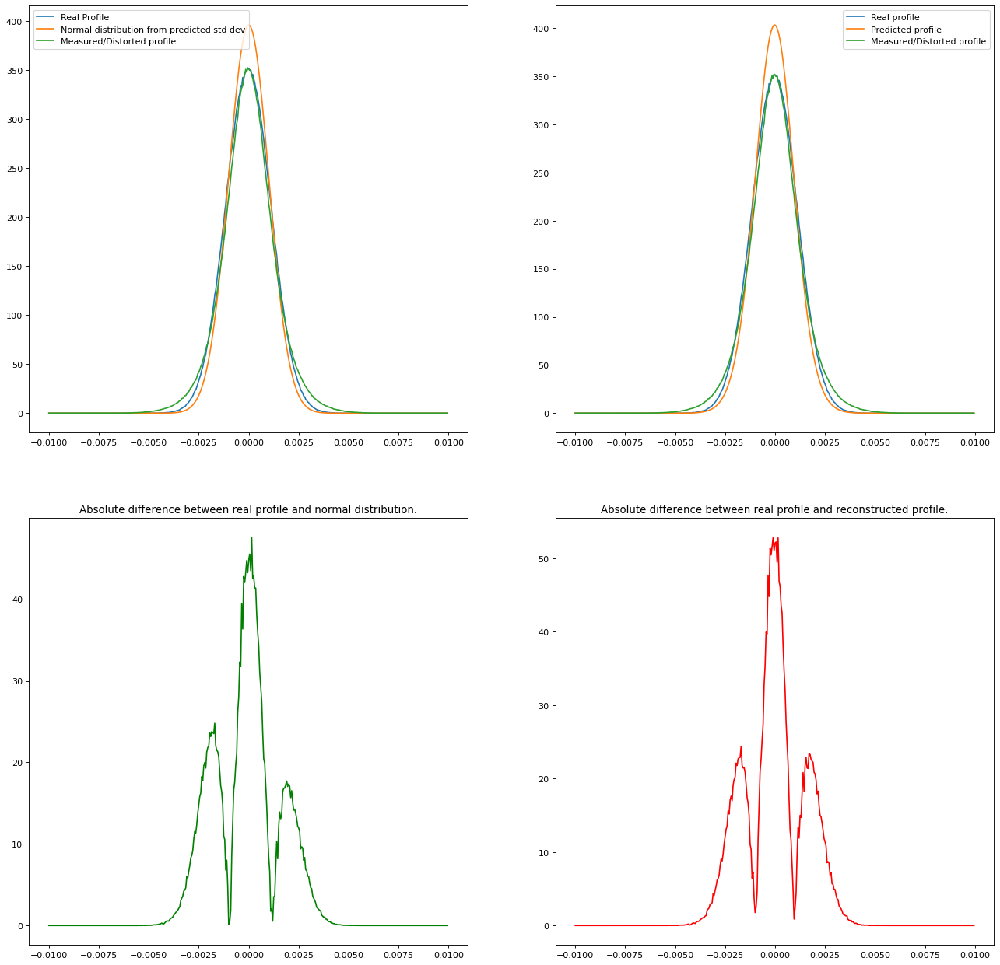

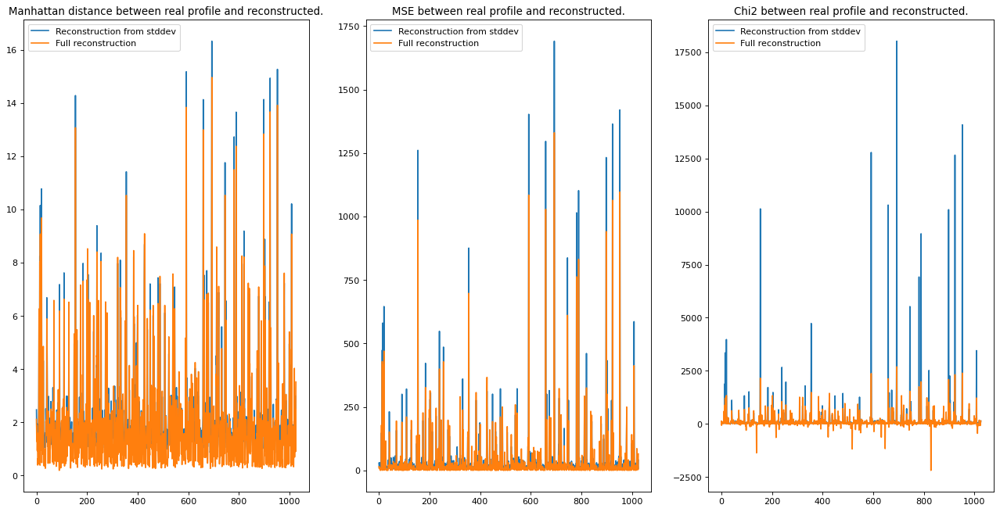

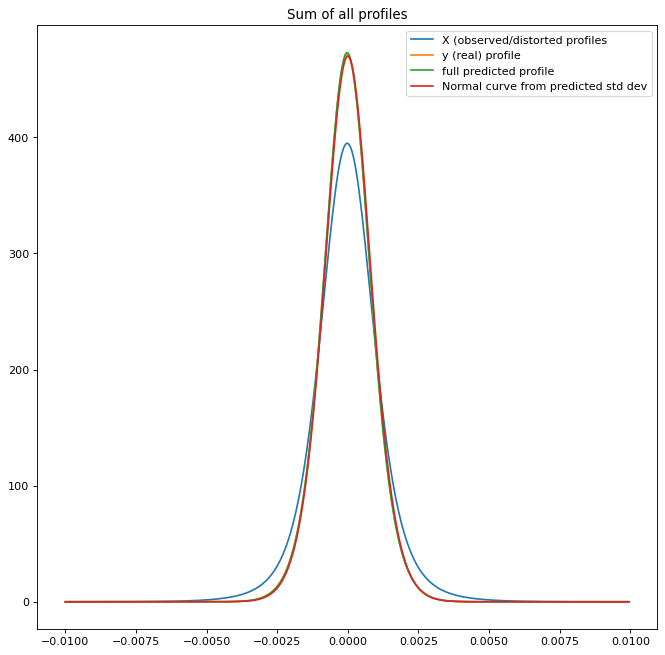

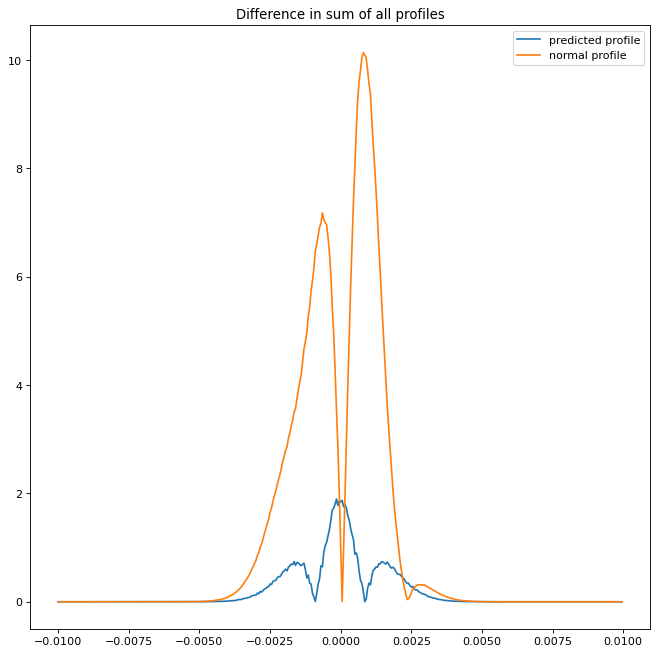

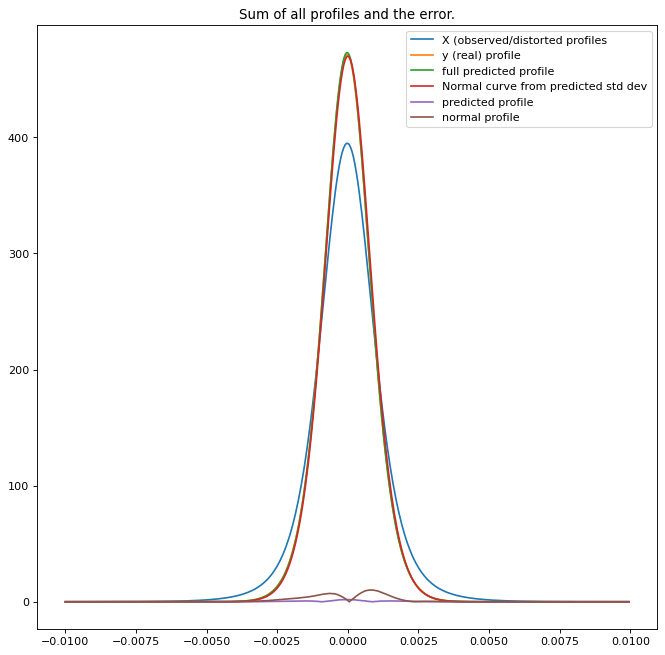

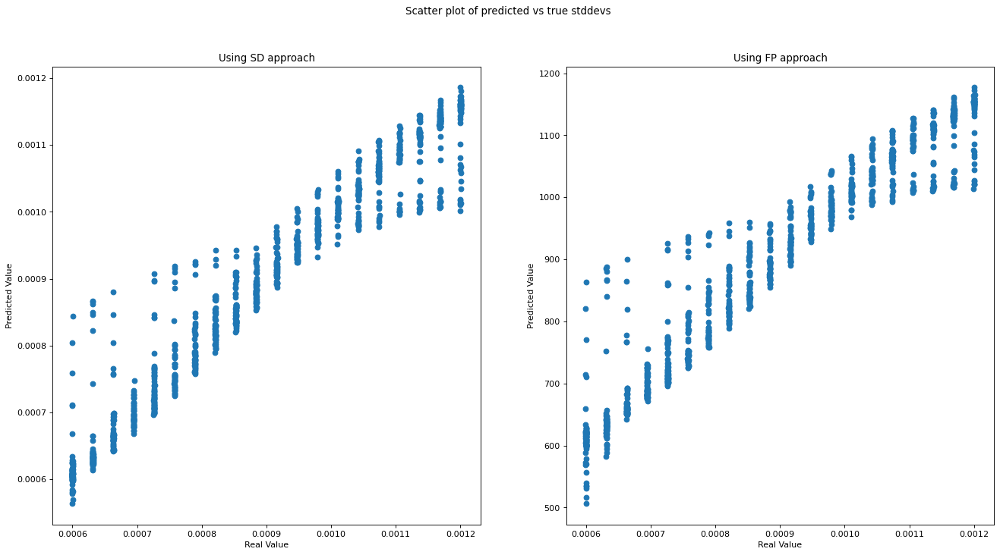

In [26]:
# Create KRR object and train on stddevs.
# Model 1
#KernelRidge(alpha=1, *, kernel='linear', gamma=None, degree=3, coef0=1, kernel_params=None)
regr_stddev = KernelRidge(alpha=10e-3, kernel='poly', gamma=None, degree=2)
regr_stddev.fit(X_train, y_train_stddev)
y_pred_stddev = regr_stddev.predict(X_test)

# Create linear regression object and train on full profile.
# Model 2
regr_profile = KernelRidge(alpha=10e-3, kernel='poly', gamma=None, degree=2)
regr_profile.fit(X_train, y_train_profile)
y_pred_profile = regr_profile.predict(X_test)

#Print metrics of each model.
modelUtils.print_model_metrics(X_train, y_train_stddev, X_test, y_test_stddev, regr_stddev)
modelUtils.print_model_metrics(X_train, y_train_profile, X_test, y_test_profile, regr_profile)

#Plot an example (index 10)
modelUtils.plot_example_recon(10, bin_width, X, y_test_profile, y_pred_profile, y_pred_stddev)

#Show the MSE, Manhat, and Chi2
modelUtils.print_error_plots(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

#Generate dataframe of normal profiles.
df = modelUtils.generate_normal_dataframe(bin_width, y_pred_stddev)

#Plot sums and sum of errors.
modelUtils.plot_sum(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)
modelUtils.plot_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)
modelUtils.plot_sum_and_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

#Rate model in format of copied paper.
modelUtils.rate_model_sd(y_test_stddev*1e6, y_pred_stddev*1e6, regr_stddev)
modelUtils.rate_model_sd(y_test_profile, y_pred_profile, regr_profile)

#Get residual dataframe.
residuals, stddev_from_profile = modelUtils.get_all_errors(bin_width, y_test_stddev, y_pred_stddev, y_pred_profile)

#Plot scatter of predictions
modelUtils.plot_scatters(y_test_stddev, y_pred_stddev, stddev_from_profile)

#Find % errors.
modelUtils.percent_errors(y_test_stddev, y_pred_stddev, stddev_from_profile)

Now lets save that model and load it back in for use of testing on different datasets.

In [120]:
#Dump to model with suffex below
suffex = 'lineartest'
model_stddev = modelUtils.dump_model_to_pickle(regr_stddev, 'linearreg_stddev', suffex)
model_profile = modelUtils.dump_model_to_pickle(regr_profile, 'linearreg_profile', suffex)

In [121]:
model_stddev = modelUtils.load_model_from_pickle('linearreg_stddev', suffex)
model_profile = modelUtils.load_model_from_pickle('linearreg_profile', suffex)

## The following is only relevent if you have a dataset that contains some difference that you'd like to compare.

In this example I varied the number of hits to see how the model would work on one with less hits. I saved each of these to new pickles with the append found in the "names" list below.

In [127]:
testloc = '/eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TestingDataV2/files/results/'

SD: Manhattan distance between plots =  1.499897327772108
SD: MS distance between plots =  12.965755001776051
SD: Chi2 goodness of fit: 33.994153064007016


FP: Manhattan distance between plots =  1.4373429627316165
FP: MS distance between plots =  12.59553956310121
FP: Chi2 goodness of fit: 44.12150120647486
Mean of the manhat distance between real and recon via SD approach: 1.5678075960695574
MSE between real and recon via SD approach: 14.718168204115917
Mean of the manhat distance between real and recon via FP approach: 1.5187097479020042
MSE between real and recon via FP approach: 16.90472378971381
                                                                                  mean of residuals    std of residuals    r2 score      MSE
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)              19.1867             14.0373     0.34782  565.175
                                                                                  mean of residuals    std o

SD: Manhattan distance between plots =  1.259626654563348
SD: MS distance between plots =  8.599557317166798
SD: Chi2 goodness of fit: 21.50899100102773


FP: Manhattan distance between plots =  0.5902091669634121
FP: MS distance between plots =  2.0475387409004977
FP: Chi2 goodness of fit: 13.262488674783008
Mean of the manhat distance between real and recon via SD approach: 1.4065645207489164
MSE between real and recon via SD approach: 11.423676205598245
Mean of the manhat distance between real and recon via FP approach: 1.126985645676866
MSE between real and recon via FP approach: 8.77898851380981
                                                                                  mean of residuals    std of residuals    r2 score      MSE
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)              14.6636             11.2666    0.605398  341.959
                                                                                  mean of residuals    std of 

SD: Manhattan distance between plots =  2.042136422840881
SD: MS distance between plots =  23.910445013686203
SD: Chi2 goodness of fit: 65.45389002763383


FP: Manhattan distance between plots =  1.8929146091530913
FP: MS distance between plots =  20.515780267947665
FP: Chi2 goodness of fit: 60.40362109635761
Mean of the manhat distance between real and recon via SD approach: 1.2404480905570812
MSE between real and recon via SD approach: 8.406710174526705
Mean of the manhat distance between real and recon via FP approach: 0.7516618045513972
MSE between real and recon via FP approach: 4.046279235400143
                                                                                  mean of residuals    std of residuals    r2 score      MSE
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)              9.24961             7.01847    0.844432  134.814
                                                                                  mean of residuals    std of

SD: Manhattan distance between plots =  1.215168066129097
SD: MS distance between plots =  8.19820422366747
SD: Chi2 goodness of fit: 19.789576046050577


FP: Manhattan distance between plots =  0.4125413882294397
FP: MS distance between plots =  1.0399455732132963
FP: Chi2 goodness of fit: 4.144186456543529
Mean of the manhat distance between real and recon via SD approach: 1.1822588504014493
MSE between real and recon via SD approach: 7.424480984804073
Mean of the manhat distance between real and recon via FP approach: 0.551228541321761
MSE between real and recon via FP approach: 2.0981568816334395


/eos/home-i00/l/lgolino/SWAN_projects/GaussianConvolutionTest/modelUtils.py:510: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  normalised_normal = (normal_df/factor_normal).sum()


                                                                                  mean of residuals    std of residuals    r2 score      MSE
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)              6.53225             5.06912    0.921109  68.3662
                                                                                  mean of residuals    std of residuals    r2 score       MSE
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)             0.249983            0.574512    0.406901  0.392555
        Real Std Dev    Predicted from profile    Predicted from stddev    Residual of FP approach    Residual of SD approach    Residual squared FP approach    Residual squared SD approach
   0         850.272                   845.761                  845.551                 4.51142                    4.72087                       20.3529                         22.2866
   1         852.323                   862.614             

SD: Manhattan distance between plots =  1.2281749511706808
SD: MS distance between plots =  8.177891381253165
SD: Chi2 goodness of fit: 20.044555831588657


FP: Manhattan distance between plots =  0.4027209506154239
FP: MS distance between plots =  1.1938641947832103
FP: Chi2 goodness of fit: 2.8963809104830793
Mean of the manhat distance between real and recon via SD approach: 1.1498354065325163
MSE between real and recon via SD approach: 6.8880365023744
Mean of the manhat distance between real and recon via FP approach: 0.41739313476665496
MSE between real and recon via FP approach: 1.1848888827520376
                                                                                  mean of residuals    std of residuals    r2 score      MSE
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)              4.54078              3.3212    0.963479  31.6491
                                                                                  mean of residuals    std 

SD: Manhattan distance between plots =  1.2260395569129354
SD: MS distance between plots =  8.150830425965093
SD: Chi2 goodness of fit: 19.949905883242998


FP: Manhattan distance between plots =  0.34779879021415794
FP: MS distance between plots =  0.9413539547935684
FP: Chi2 goodness of fit: 2.5953463838477355
Mean of the manhat distance between real and recon via SD approach: 1.1359794863690527
MSE between real and recon via SD approach: 6.662100435208208
Mean of the manhat distance between real and recon via FP approach: 0.33725237212679565
MSE between real and recon via FP approach: 0.7720155774316754
                                                                                  mean of residuals    std of residuals    r2 score      MSE
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)              3.23596             2.36877    0.981442  16.0825
                                                                                  mean of residuals    s

SD: Manhattan distance between plots =  1.202696155834773
SD: MS distance between plots =  7.826716579051428
SD: Chi2 goodness of fit: 18.746501868634528


FP: Manhattan distance between plots =  0.23661802983887165
FP: MS distance between plots =  0.3897741849623985
FP: Chi2 goodness of fit: 3.0601988314736515
Mean of the manhat distance between real and recon via SD approach: 1.1274525929045076
MSE between real and recon via SD approach: 6.520433179210478
Mean of the manhat distance between real and recon via FP approach: 0.27543819226242106
MSE between real and recon via FP approach: 0.5181532871112833
                                                                                  mean of residuals    std of residuals    r2 score      MSE
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)              2.00666             1.55215    0.992573  6.43586
                                                                                  mean of residuals    st

SD: Manhattan distance between plots =  1.2048079953873085
SD: MS distance between plots =  7.855960599815023
SD: Chi2 goodness of fit: 18.88997960916999


FP: Manhattan distance between plots =  0.26117646261277566
FP: MS distance between plots =  0.5046726175229557
FP: Chi2 goodness of fit: 1.7447222734485088
Mean of the manhat distance between real and recon via SD approach: 1.124638066162431
MSE between real and recon via SD approach: 6.468979972980229
Mean of the manhat distance between real and recon via FP approach: 0.25055393463012565
MSE between real and recon via FP approach: 0.4296391658700601
                                                                                  mean of residuals    std of residuals    r2 score      MSE
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)              1.35536             1.02115    0.996677  2.87975
                                                                                  mean of residuals    std

SD: Manhattan distance between plots =  1.2039942326464417
SD: MS distance between plots =  7.834973868076762
SD: Chi2 goodness of fit: 18.80321589021541


FP: Manhattan distance between plots =  0.23541479719978425
FP: MS distance between plots =  0.4408827887504102
FP: Chi2 goodness of fit: 1.5812828887347874
Mean of the manhat distance between real and recon via SD approach: 1.1228130327014743
MSE between real and recon via SD approach: 6.441318607459146
Mean of the manhat distance between real and recon via FP approach: 0.23392775321503592
MSE between real and recon via FP approach: 0.3764738321878057
                                                                                  mean of residuals    std of residuals    r2 score      MSE
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)             0.809072            0.593624    0.998838  1.00699
                                                                                  mean of residuals    st

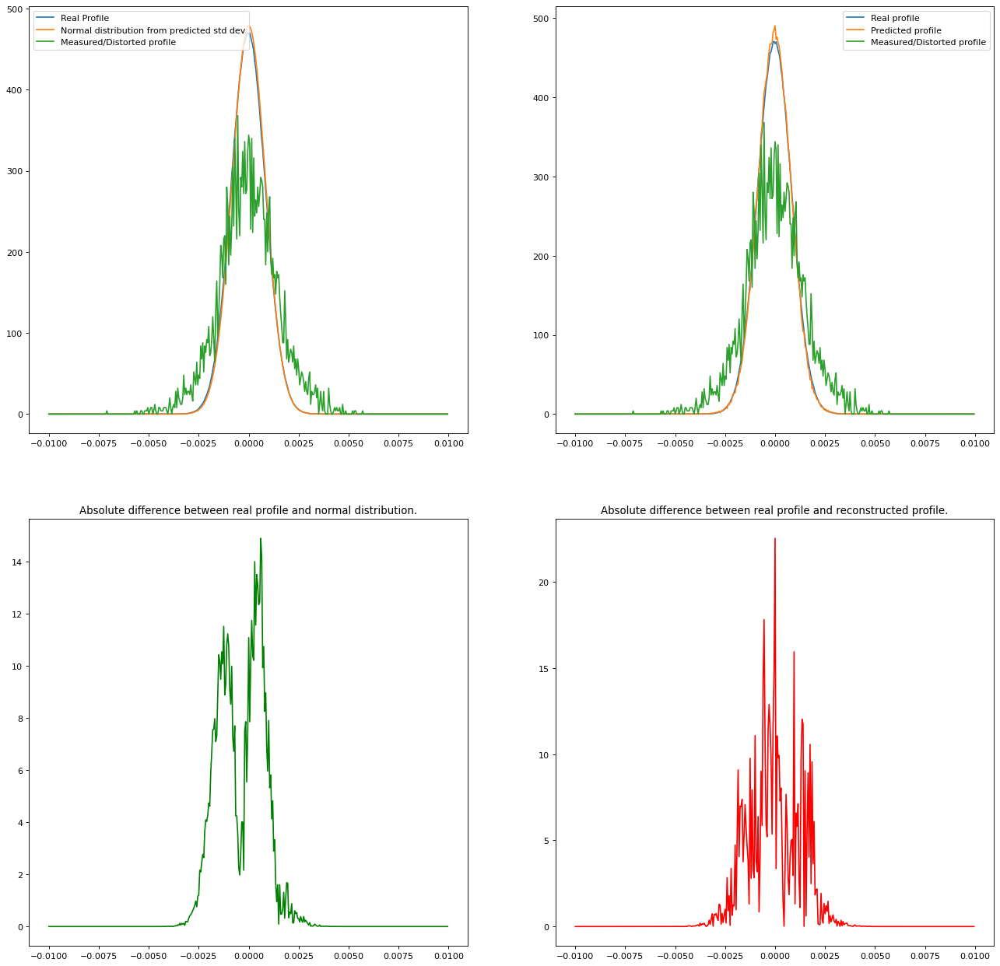

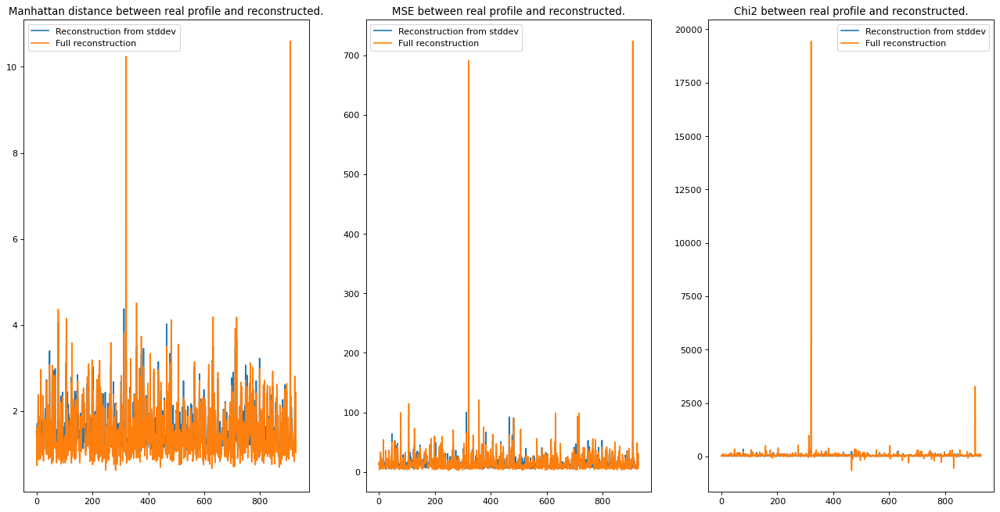

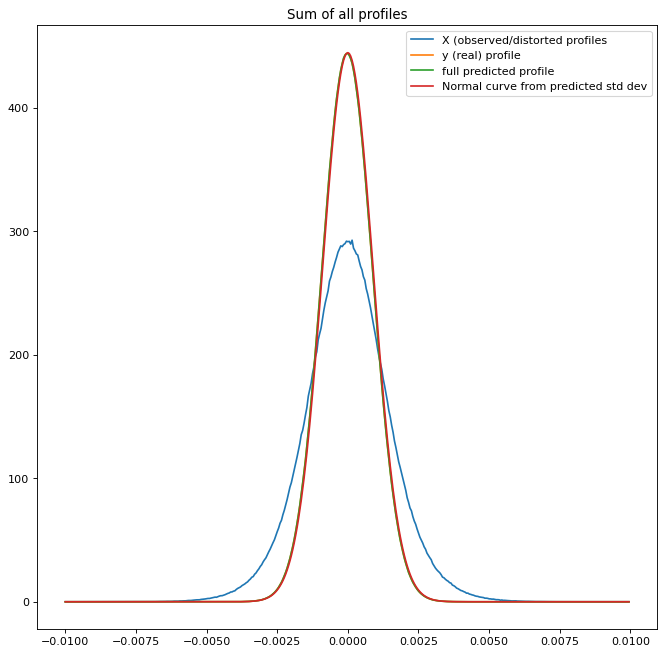

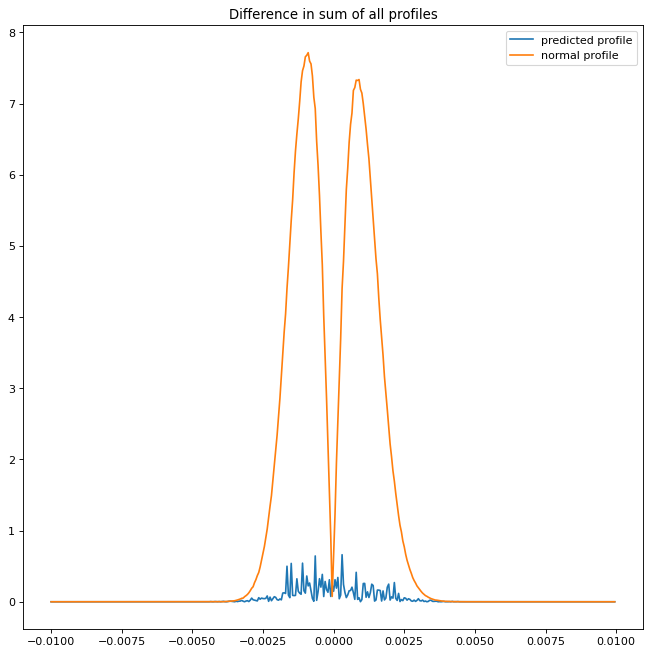

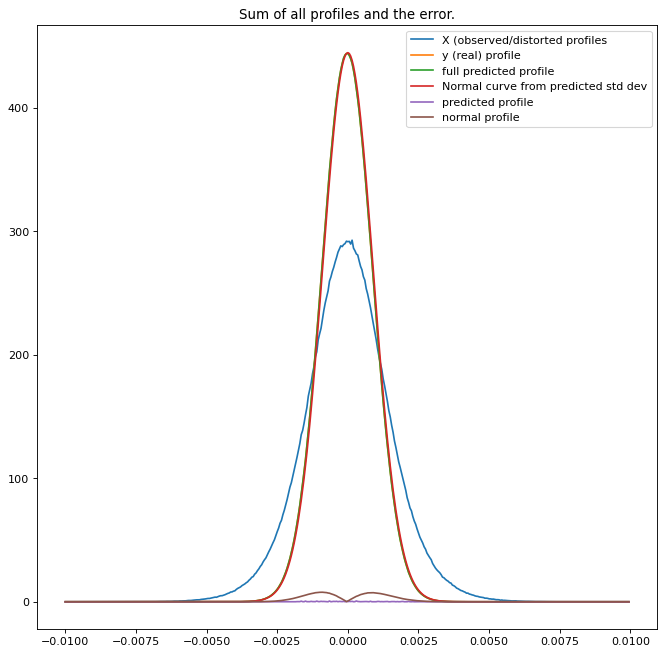

...

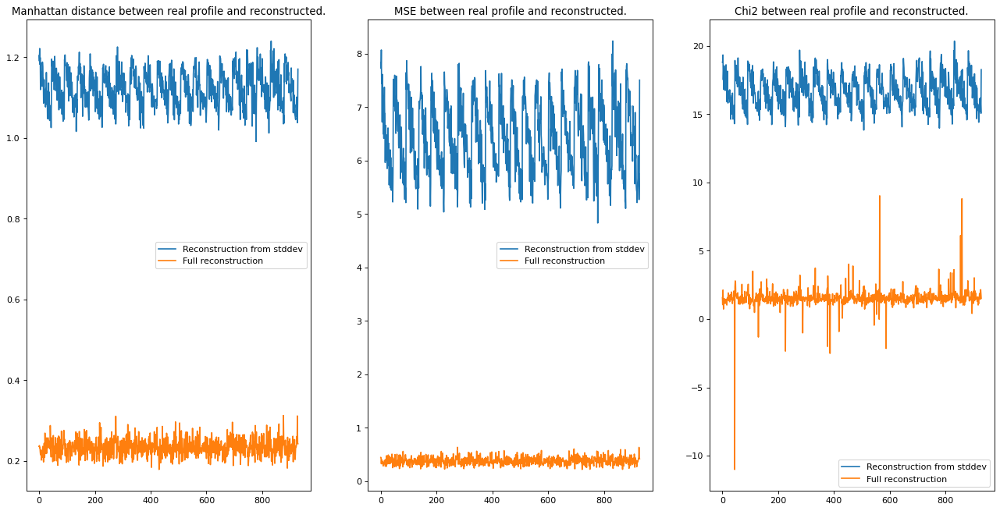

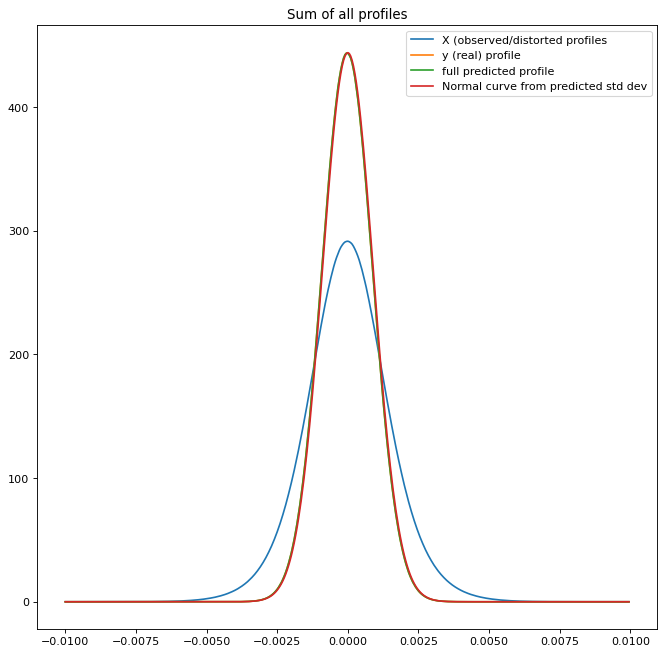

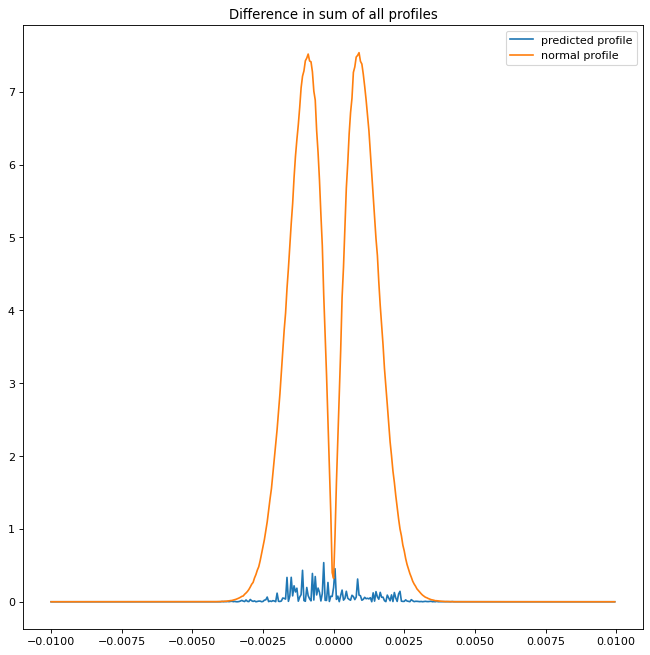

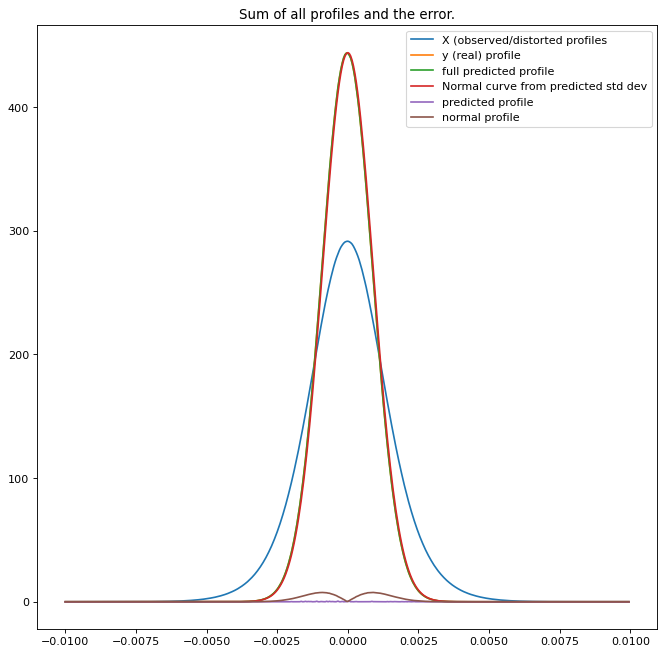

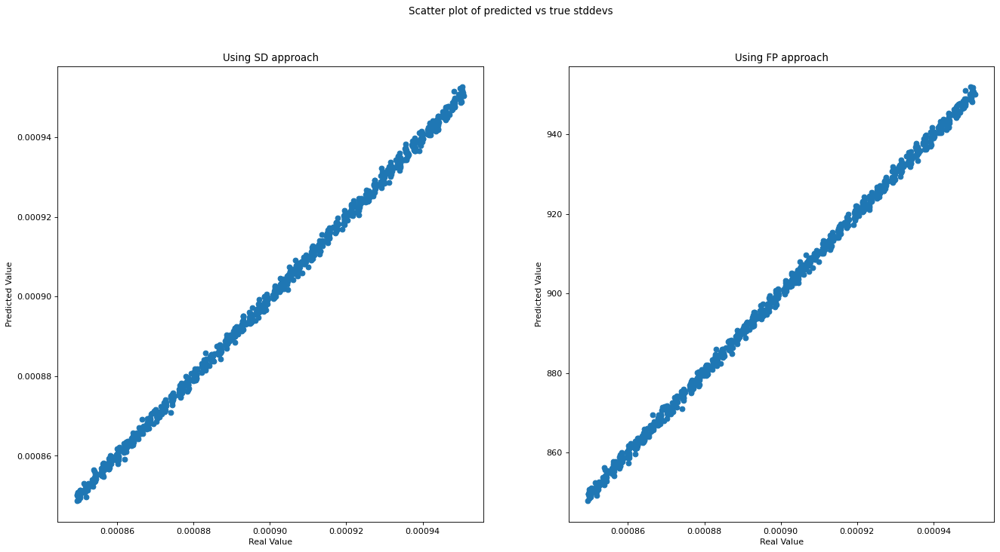

In [144]:
#These two are required for a few of the following cells
all_residuals = []
all_percents = []

names = ['5k', '10k', '25k', '50k', '100k', '200k', '500k', '1mil', '3mil']
for appendage in names:
    X, ystddev, yhists = modelUtils.load_from_pickle(testloc+'../', appendage, True)
    #If you would like to convert to metres now is the time to do so.
    #ystddev = ystddev*1e6
    #Also convert the profiles to percentages, this should allow you to apply it to profiles with any number of hits as long as they are also normalised.
    X = modelUtils.normalise_profile_percent(X)
    yhists = modelUtils.normalise_profile_percent(yhists)
    #Split into train and test data. Shuffling here is important because if you use a range of values in V-IPM then the while last 20% of the set may have
    #different beam parameters than the first 80%. Keeping the state consistent is important though.
    X_test = X
    y_test_stddev = ystddev
    y_test_profile = yhists
    #y_train_profile # Just to see
    # Create linear regression object and train on stddevs.
    # Model 1
    regr_stddev = model_stddev
    y_pred_stddev = regr_stddev.predict(X_test)
    # Create linear regression object and train on full profile.
    # Model 2
    regr_profile = model_profile
    y_pred_profile = regr_profile.predict(X_test)

    #Print metrics of each model.
    #modelUtils.print_model_metrics(X_train, y_train_stddev, X_test, y_test_stddev, regr_stddev)
    #modelUtils.print_model_metrics(X_train, y_train_profile, X_test, y_test_profile, regr_profile)

    #Plot an example (index 10)
    modelUtils.plot_example_recon(0, bin_width, X, y_test_profile, y_pred_profile, y_pred_stddev)

    #Show the MSE, Manhat, and Chi2
    modelUtils.print_error_plots(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

    #Generate dataframe of normal profiles.
    df = modelUtils.generate_normal_dataframe(bin_width, y_pred_stddev)

    #Plot sums and sum of errors.
    modelUtils.plot_sum(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)
    modelUtils.plot_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)
    modelUtils.plot_sum_and_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

    #Rate model in format of copied paper.
    modelUtils.rate_model_sd(y_test_stddev*1e6, y_pred_stddev*1e6, regr_stddev)
    modelUtils.rate_model_sd(y_test_profile, y_pred_profile, regr_profile)

    #Get residual dataframe.
    residuals, stddev_from_profile = modelUtils.get_all_errors(bin_width, y_test_stddev, y_pred_stddev, y_pred_profile)
    all_residuals.append(residuals)

    #Plot scatter of predictions
    modelUtils.plot_scatters(y_test_stddev, y_pred_stddev, stddev_from_profile)

    #Find % errors.
    percents = modelUtils.percent_errors(y_test_stddev, y_pred_stddev, stddev_from_profile)
    all_percents.append(percents)

In [145]:
pred_df = pd.DataFrame(y_pred_profile)
pred_df

,0,1,2,3,4,5,6,7,8,9,...,390,391,392,393,394,395,396,397,398,399
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
924,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
925,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
926,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
927,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Some error analysis and percentile graphs

A =  3626459.0532438788 m =  -1.0111109658064588


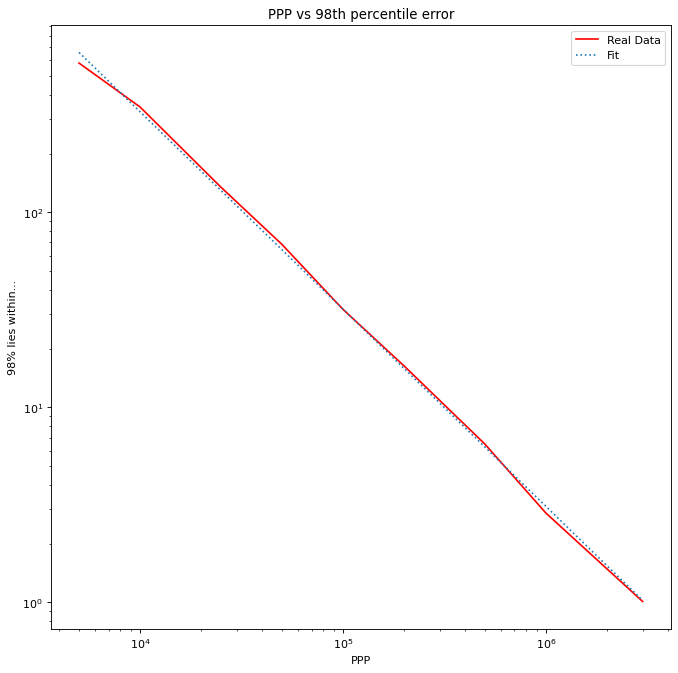

In [146]:
ppp = [5000, 10000, 25000, 50000, 100000, 200000, 500000, 1000000, 3000000]
acc = [np.percentile(all_percents[i]['From SD'], 98) for i in range(0,9)]
acc = [all_residuals[i]['Residual squared FP approach'].mean() for i in range(0,9)]

logA = np.log(ppp) #no need for list comprehension since all z values >= 1
logB = np.log(acc)

m, c = np.polyfit(logA, logB, 1) # fit log(y) = m*log(x) + c
y_fit = np.exp(m*logA + c)
y_fit2 = np.exp(c)*np.power(ppp,m)

print('A = ', np.exp(c), 'm = ', m)

plt.figure(figsize=(10, 10), dpi=80)
plt.plot(ppp, acc, color = 'r', label='Real Data')
plt.plot(ppp, y_fit2, ':', label='Fit')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('PPP')
plt.ylabel('98% lies within...')
plt.title('PPP vs 98th percentile error')
plt.legend()

([<matplotlib.axis.XTick at 0x7f3749a70e20>,
 [Text(5000, 0, '5k'),
  Text(10000, 0, '10k'),
  Text(25000, 0, '25k'),
  Text(50000, 0, '50k'),
  Text(100000, 0, '100k'),
  Text(200000, 0, '200k'),
  Text(500000, 0, '500k'),
  Text(1000000, 0, '1mil'),
  Text(3000000, 0, '3mil')])

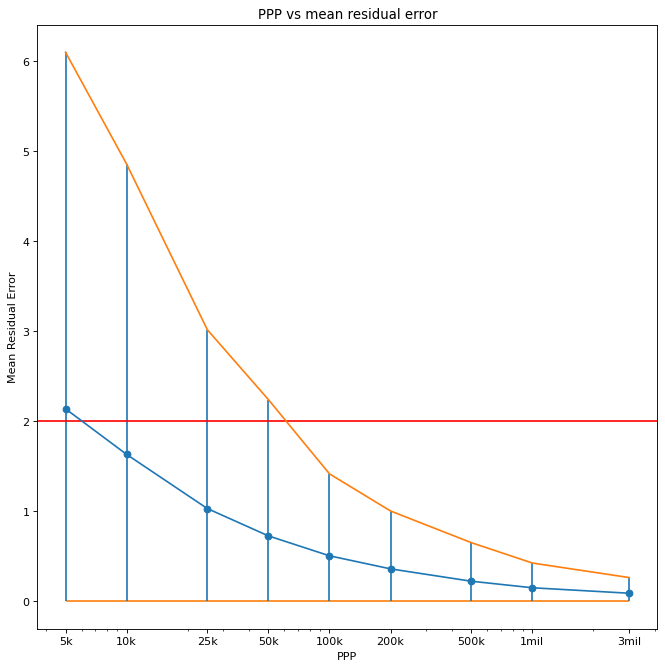

In [147]:
ppp = [5000, 10000, 25000, 50000, 100000, 200000, 500000, 1000000, 3000000]
acc = [all_residuals[i]['Residual squared FP approach'].mean() for i in range(0,9)]
acc = [all_percents[i]['From SD'].mean() for i in range(0,9)]

lower_err = [0+all_percents[i]['From SD'].mean() for i in range(0,9)]
upper_err = [np.percentile(all_percents[i]['From SD']-all_percents[i]['From SD'].mean(), 98) for i in range(0,9)]
raw_98 = [np.percentile(all_percents[i]['From SD'], 98) for i in range(0,9)]


asymmetric_error = [lower_err, upper_err]

plt.figure(figsize=(10, 10), dpi=80)
plt.xscale('log')
#plt.yscale('log')
plt.axhline(y=2, color='r', linestyle='-')
plt.hlines(y=0, color='C1', linestyle='-', xmin=5000, xmax=3000000)

plt.errorbar(ppp, acc, yerr=asymmetric_error, fmt='.-')
plt.scatter(ppp, acc)
plt.plot(ppp, raw_98)

plt.xlabel('PPP')
plt.ylabel('Mean Residual Error')
plt.title('PPP vs mean residual error')
plt.xticks(ppp, names)
#plt.yticks(acc, acc)
#plt.yticks(upper_err, upper_err)

## Below is just testing other models. Essentially the pipeline is finished here but you may want to play around with these new models and so the code remains here.

### KRR

/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

Printing metrics about model 1 (std dev).
Mean squared error: 0.000000000002559 in um.
Coefficient of determination: -70.378606490743323
Score: -61.547041584228950 

Printing metrics about model 1 (std dev).
Mean squared error: 0.000011584995474 in um.
Coefficient of determination: 0.627752201479850
Score: -0.400854532818384 

SD: Manhattan distance between plots =  1.6202178367427962
SD: MS distance between plots =  19.644152468190114
SD: Chi2 goodness of fit: 34.43085476907106


FP: Manhattan distance between plots =  0.1453238900683146
FP: MS distance between plots =  0.199908372842489
FP: Chi2 goodness of fit: 0.7264049466593788
Mean of the manhat distance between real and recon via SD approach: 1.6701392143130969
MSE between real and recon via SD approach: 20.801480494838263
Mean of the manhat distance between real and recon via FP approach: 0.17117471041996182
MSE between real and recon via FP approach: 0.30259926349588817
                                                         

,From SD,From FP
0,0.588082,0.060287
1,0.374711,0.015508
2,0.465619,0.007070
3,0.573729,0.028938
4,0.226593,0.028680
5,0.043370,0.087343
6,0.090020,0.028218
7,0.068529,0.004097
8,0.130079,0.038424
9,0.114401,0.024274


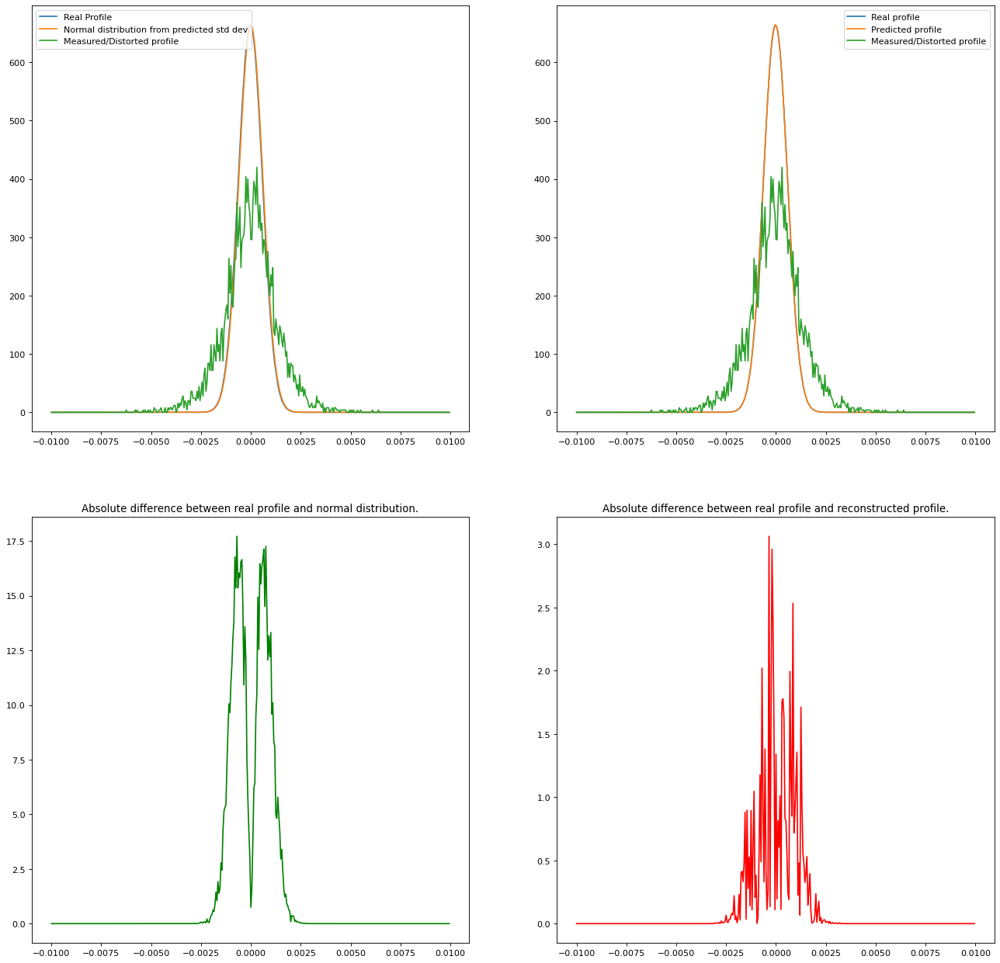

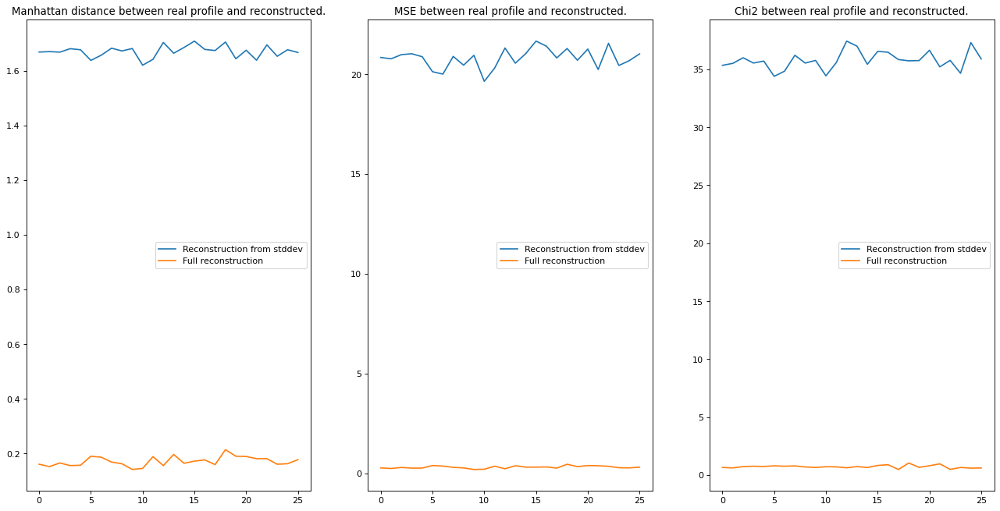

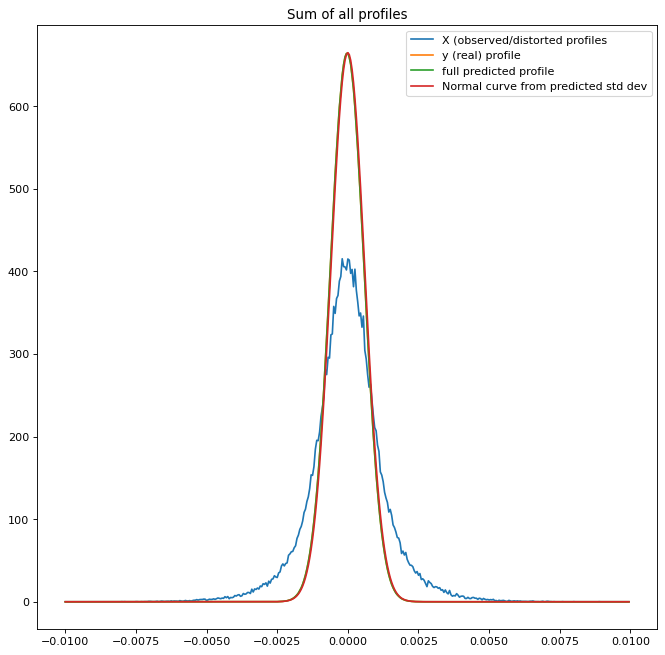

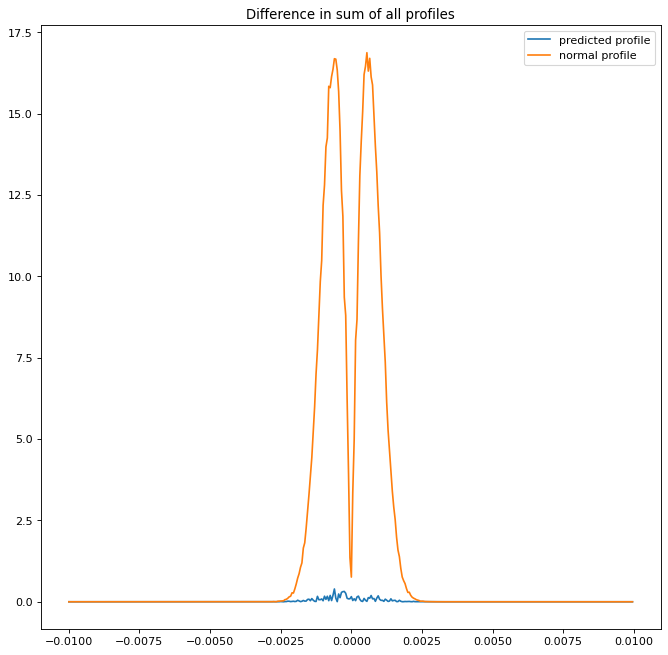

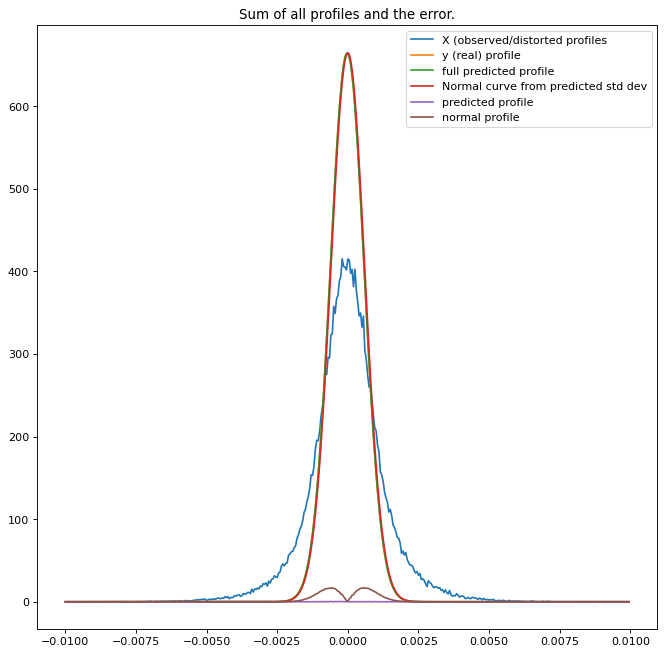

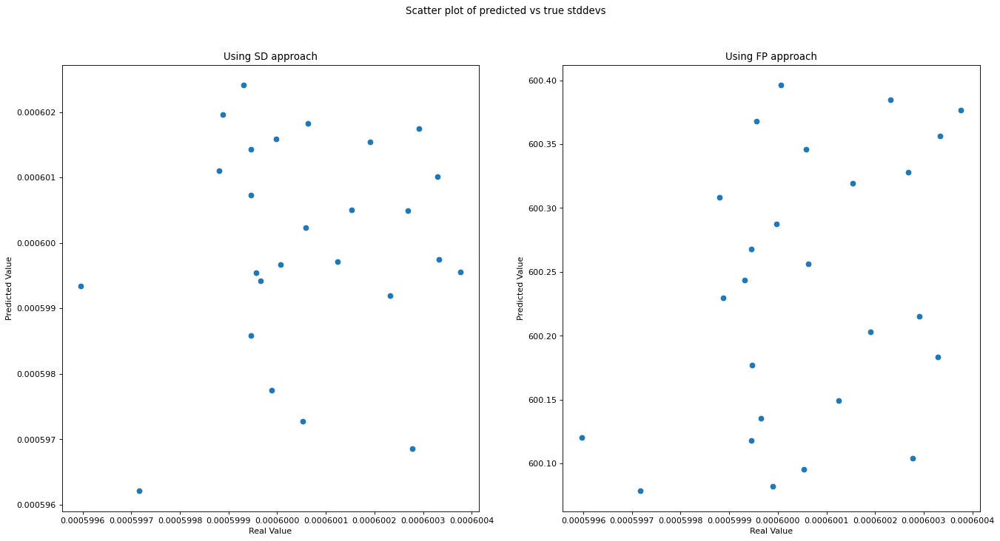

In [35]:
# Create KRR object and train on stddevs.
# Model 1
#KernelRidge(alpha=1, *, kernel='linear', gamma=None, degree=3, coef0=1, kernel_params=None)
regr_stddev = KernelRidge(alpha=10e-3, kernel='poly', gamma=None, degree=2)
regr_stddev.fit(X_train, y_train_stddev)
y_pred_stddev = regr_stddev.predict(X_test)

# Create linear regression object and train on full profile.
# Model 2
regr_profile = KernelRidge(alpha=10e-3, kernel='poly', gamma=None, degree=2)
regr_profile.fit(X_train, y_train_profile)
y_pred_profile = regr_profile.predict(X_test)

#Print metrics of each model.
modelUtils.print_model_metrics(X_train, y_train_stddev, X_test, y_test_stddev, regr_stddev)
modelUtils.print_model_metrics(X_train, y_train_profile, X_test, y_test_profile, regr_profile)

#Plot an example (index 10)
modelUtils.plot_example_recon(10, bin_width, X, y_test_profile, y_pred_profile, y_pred_stddev)

#Show the MSE, Manhat, and Chi2
modelUtils.print_error_plots(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

#Generate dataframe of normal profiles.
df = modelUtils.generate_normal_dataframe(bin_width, y_pred_stddev)

#Plot sums and sum of errors.
modelUtils.plot_sum(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)
modelUtils.plot_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)
modelUtils.plot_sum_and_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

#Rate model in format of copied paper.
modelUtils.rate_model_sd(y_test_stddev*1e6, y_pred_stddev*1e6, regr_stddev)
modelUtils.rate_model_sd(y_test_profile, y_pred_profile, regr_profile)

#Get residual dataframe.
residuals, stddev_from_profile = modelUtils.get_all_errors(bin_width, y_test_stddev, y_pred_stddev, y_pred_profile)

#Plot scatter of predictions
modelUtils.plot_scatters(y_test_stddev, y_pred_stddev, stddev_from_profile)

#Find % errors.
modelUtils.percent_errors(y_test_stddev, y_pred_stddev, stddev_from_profile)

### SVM

/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings

/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings

/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings

/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings

/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings

/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings

/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings

/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings

Printing metrics about model 1 (std dev).
Mean squared error: 0.000000000003451 in um.
Coefficient of determination: 0.995864272628134
Score: 0.995870207933860 

Printing metrics about model 1 (std dev).
Mean squared error: 0.000019591786678 in um.
Coefficient of determination: 0.660570436969619
Score: 0.664494492467675 

SD: Manhattan distance between plots =  1.1053401341079458
SD: MS distance between plots =  6.047034252268896
SD: Chi2 goodness of fit: 15.910123033559751


FP: Manhattan distance between plots =  0.3431788031412827
FP: MS distance between plots =  0.7953110848777208
FP: Chi2 goodness of fit: 2.4891381629088727
Mean of the manhat distance between real and recon via SD approach: 1.1261144672616192
MSE between real and recon via SD approach: 6.490229040699237
Mean of the manhat distance between real and recon via FP approach: 0.3357110063355062
MSE between real and recon via FP approach: 0.7760943422894272
                           mean of residuals    std of residuals

IndexError: invalid index to scalar variable.

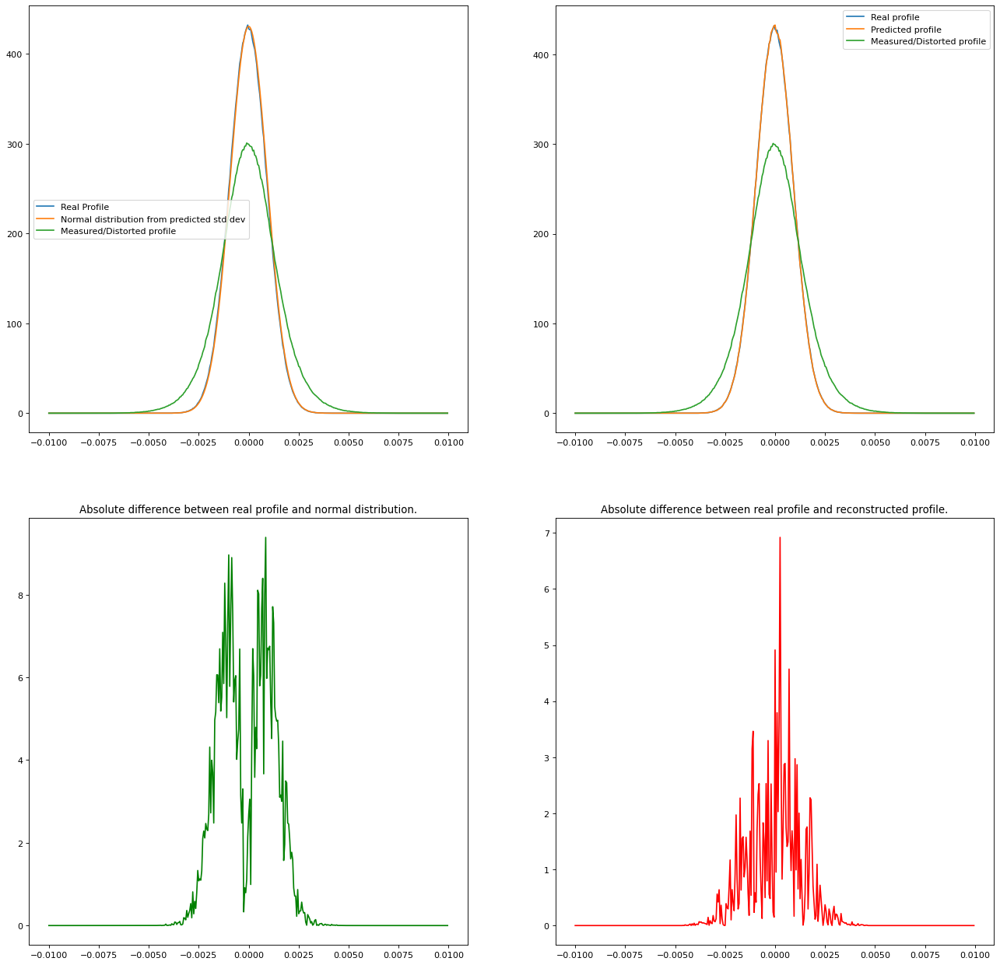

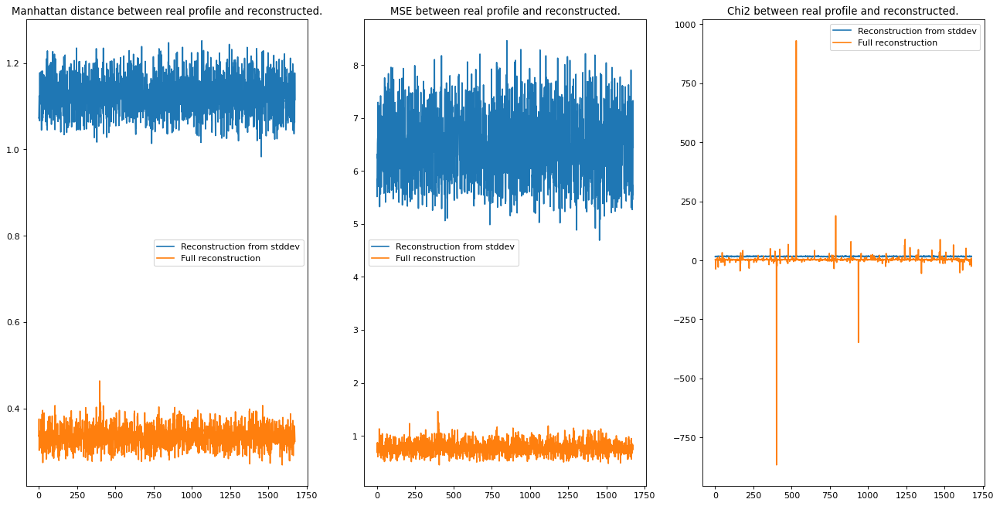

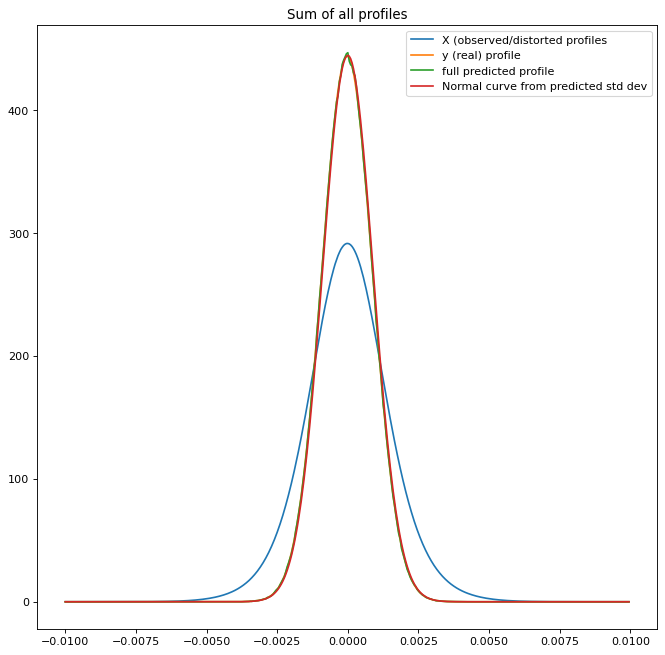

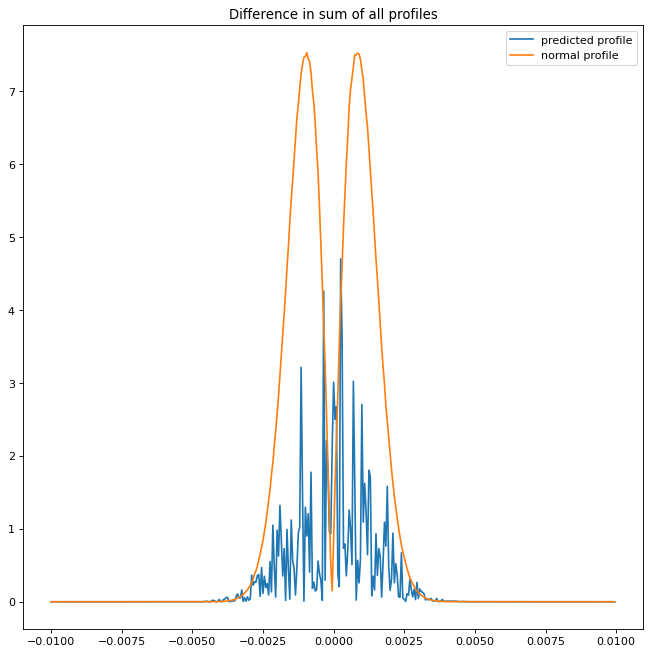

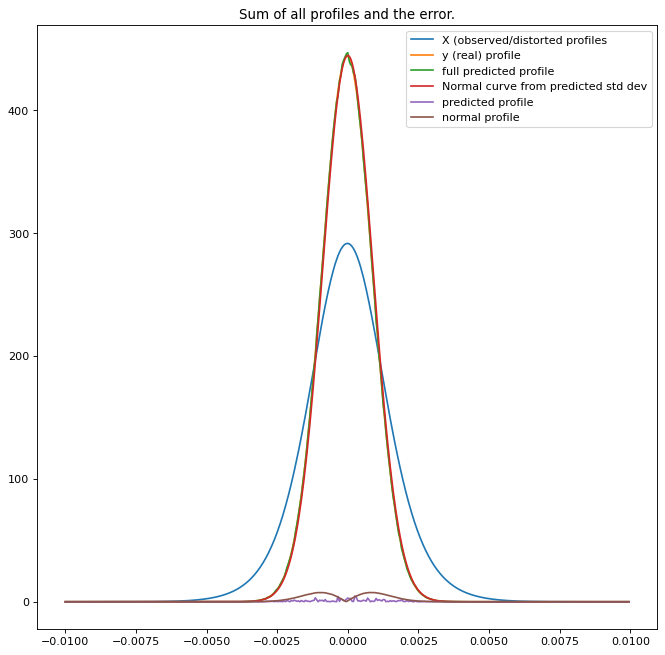

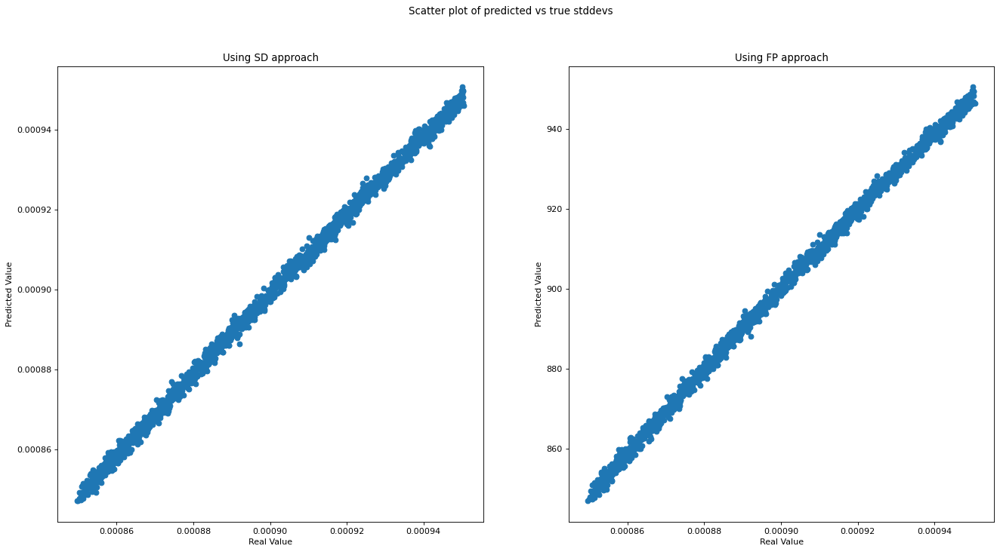

In [23]:
# Create linear regression object and train on stddevs.
# Model 1
#regr_stddev = svm.SVR(gamma=10e-4, C=10e3, epsilon=10e-8)
#regr_stddev = svm.SVR()
#regr_stddev = svm.LinearSVR(gamma=10e-4, C=10e3, epsilon=10e-8, max_iter = 20000)
regr_stddev = svm.LinearSVR(max_iter=100)
#regr_stddev = svm.NuSVR()
regr_stddev.fit(X_train, np.ravel(y_train_stddev))
y_pred_stddev = regr_stddev.predict(X_test)

# Create SVM object and train on full profile.
# Model 2
# This is probably a terrible idea as it requires a new model for each target variable (ie 400 models)
regr_profile = MultiOutputRegressor(svm.LinearSVR(max_iter=100))
regr_profile.fit(X_train, y_train_profile)
y_pred_profile = regr_profile.predict(X_test)

#Print metrics of each model.
modelUtils.print_model_metrics(X_train, y_train_stddev, X_test, y_test_stddev, regr_stddev)
modelUtils.print_model_metrics(X_train, y_train_profile, X_test, y_test_profile, regr_profile)

#Plot an example (index 10)
modelUtils.plot_example_recon(10, bin_width, X, y_test_profile, y_pred_profile, y_pred_stddev)

#Show the MSE, Manhat, and Chi2
modelUtils.print_error_plots(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

#Generate dataframe of normal profiles.
df = modelUtils.generate_normal_dataframe(bin_width, y_pred_stddev)

#Plot sums and sum of errors.
modelUtils.plot_sum(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)
modelUtils.plot_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)
modelUtils.plot_sum_and_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

#Rate model in format of copied paper.
modelUtils.rate_model_sd(y_test_stddev*1e6, y_pred_stddev*1e6, regr_stddev)
modelUtils.rate_model_sd(y_test_profile, y_pred_profile, regr_profile)

#Get residual dataframe.
residuals, stddev_from_profile = modelUtils.get_all_errors(bin_width, y_test_stddev, y_pred_stddev, y_pred_profile)

#Plot scatter of predictions
modelUtils.plot_scatters(y_test_stddev, y_pred_stddev, stddev_from_profile)

#Find % errors.
modelUtils.percent_errors(y_test_stddev, y_pred_stddev, stddev_from_profile)

### MLP

Printing metrics about model 1 (std dev).
Mean squared error: 0.000000018177933 in um.
Coefficient of determination: -20.782649627924354
Score: -20.279676413341267 

Printing metrics about model 1 (std dev).
Mean squared error: 0.000012154735340 in um.
Coefficient of determination: -27421.836840936310182
Score: -161029.012702900392469 

SD: Manhattan distance between plots =  9.292760259898202
SD: MS distance between plots =  462.1808489081128
SD: Chi2 goodness of fit: 1104.4479289476226


FP: Manhattan distance between plots =  0.3785297471675865
FP: MS distance between plots =  0.501654922421039
FP: Chi2 goodness of fit: 11.328202186813048
Mean of the manhat distance between real and recon via SD approach: 7.698983017188138
MSE between real and recon via SD approach: 334.79553271906576
Mean of the manhat distance between real and recon via FP approach: 0.37130591284245534
MSE between real and recon via FP approach: 0.49882495688218575
                                                 

/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/scipy/stats/stats.py:4484: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


ValueError: Unable to coerce to Series, length must be 1: given 1675

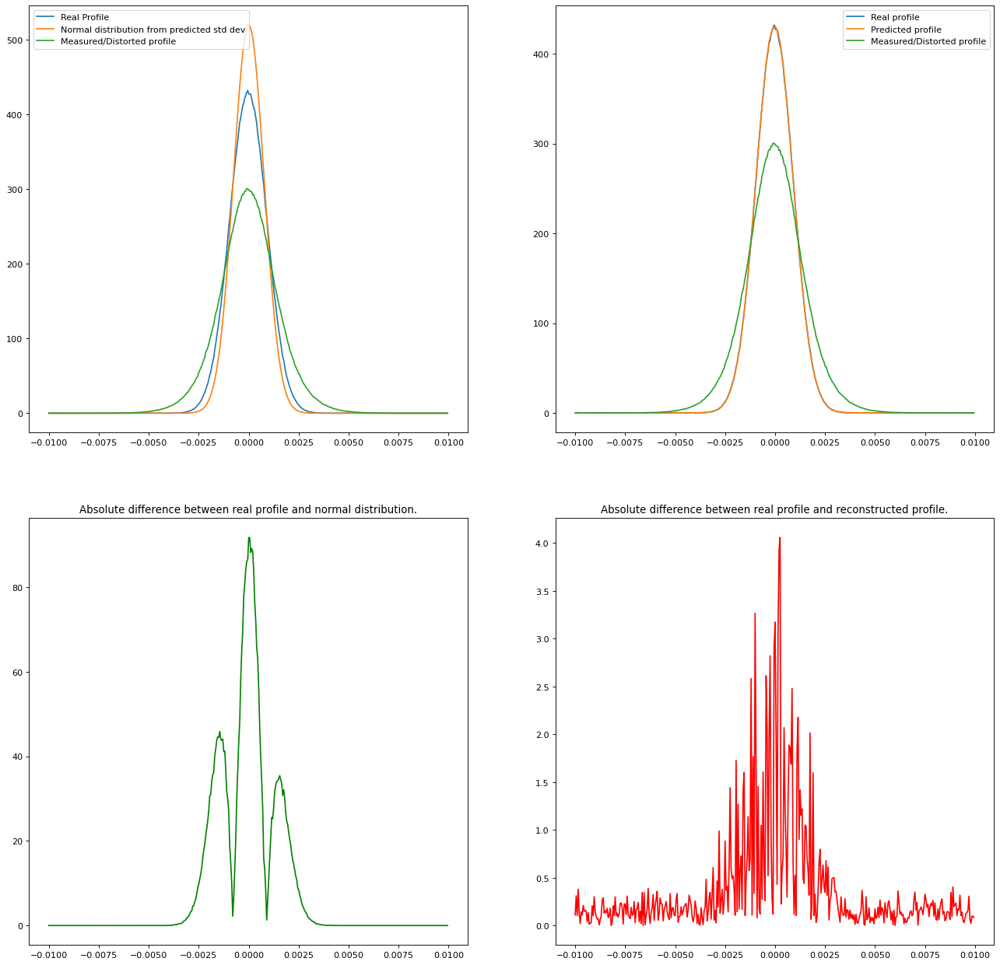

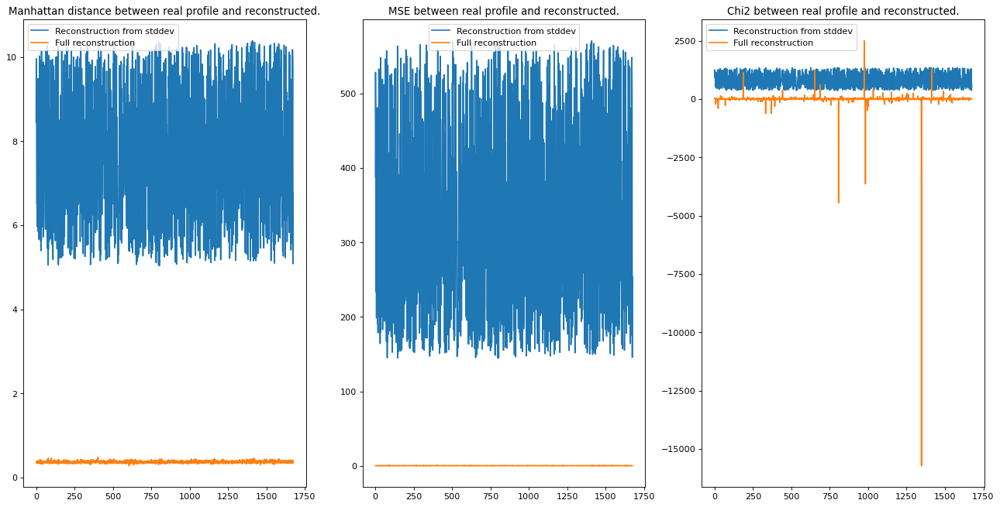

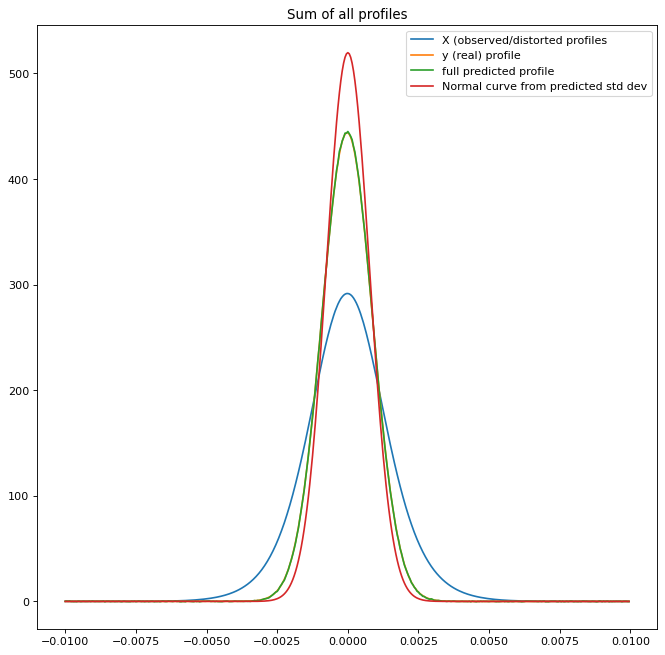

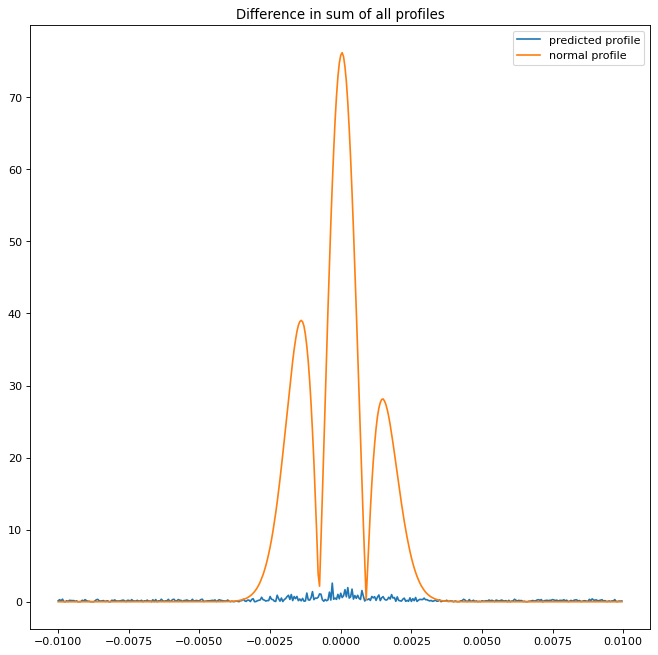

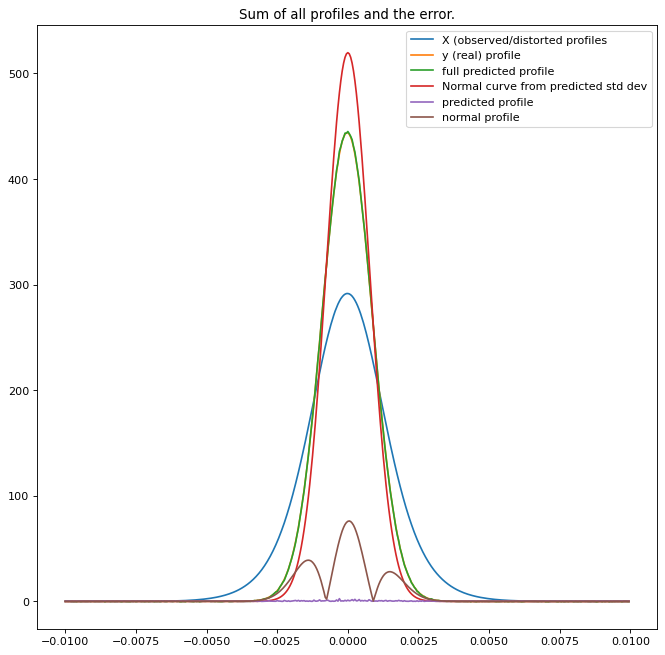

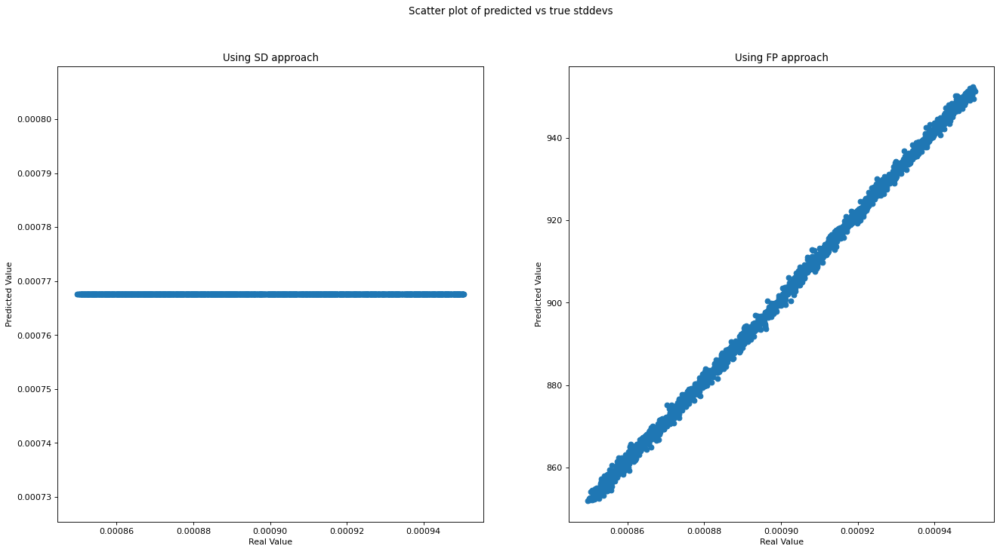

In [50]:
# Create linear regression object and train on stddevs.
# Model 1
regr_stddev = MLPRegressor(hidden_layer_sizes=(200,170,140,110),activation="relu" ,solver='adam', batch_size=256, random_state=1, max_iter=20000)
regr_stddev.fit(X_train, np.ravel(y_train_stddev))
y_pred_stddev = regr_stddev.predict(X_test)

regr_profile = MLPRegressor(hidden_layer_sizes=(200,170,140,110),activation="relu" ,solver='adam', batch_size=256, random_state=1, max_iter=20000)
regr_profile.fit(X_train, y_train_profile)
y_pred_profile = regr_profile.predict(X_test)

#Print metrics of each model.
modelUtils.print_model_metrics(X_train, y_train_stddev, X_test, y_test_stddev, regr_stddev)
modelUtils.print_model_metrics(X_train, y_train_profile, X_test, y_test_profile, regr_profile)

#Plot an example (index 10)
modelUtils.plot_example_recon(10, bin_width, X, y_test_profile, y_pred_profile, y_pred_stddev)

#Show the MSE, Manhat, and Chi2
modelUtils.print_error_plots(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

#Generate dataframe of normal profiles.
df = modelUtils.generate_normal_dataframe(bin_width, y_pred_stddev)

#Plot sums and sum of errors.
modelUtils.plot_sum(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)
modelUtils.plot_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)
modelUtils.plot_sum_and_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

#Rate model in format of copied paper.
modelUtils.rate_model_sd(y_test_stddev*1e6, y_pred_stddev*1e6, regr_stddev)
modelUtils.rate_model_sd(y_test_profile, y_pred_profile, regr_profile)

#Get residual dataframe.
residuals, stddev_from_profile = modelUtils.get_all_errors(bin_width, y_test_stddev, y_pred_stddev, y_pred_profile)

#Plot scatter of predictions
modelUtils.plot_scatters(y_test_stddev, y_pred_stddev, stddev_from_profile)

#Find % errors.
modelUtils.percent_errors(y_test_stddev, y_pred_stddev, stddev_from_profile)

In [62]:
# Create linear regression object and train on stddevs.
# Model 1
regr_stddev = MLPRegressor(hidden_layer_sizes=(500,250,125,50, 1),activation="relu" ,solver='adam', batch_size=256, random_state=1, max_iter=20000)
regr_stddev.fit(X_train, np.ravel(y_train_stddev))
y_pred_stddev = regr_stddev.predict(X_test)

regr_profile = MLPRegressor(hidden_layer_sizes=(500,250,125,75),activation="relu" ,solver='adam', batch_size=256, random_state=1, max_iter=20000)
regr_profile.fit(X_train, y_train_profile)
y_pred_profile = regr_profile.predict(X_test)

In [63]:
modelUtils.print_model_metrics(X_train, y_train_stddev, X_test, y_test_stddev, regr_stddev)
modelUtils.print_model_metrics(X_train, y_train_profile, X_test, y_test_profile, regr_profile)

Printing metrics about model 1 (std dev).
Mean squared error: 0.000000000836544 in um.
Coefficient of determination: -0.002432570467815
Score: -0.006724285839418 

Printing metrics about model 1 (std dev).
Mean squared error: 0.000228096560187 in um.
Coefficient of determination: -196882.638884941407014
Score: -925637.877661991282366 



#### This is a grid search to find the best variables for the model

In [71]:
#Model 1
parameters = { 'hidden_layer_sizes':[(500,250,125,50,1), (400,200,100,50,1), (200,170,140,110)], 'activation':['relu'], 'solver':['adam'], 'batch_size':[8, 16, 32, 64]}

mlp_reg_std = MLPRegressor()
regr_stddev_grid = GridSearchCV(mlp_reg_std, parameters, n_jobs=-1, verbose=4)
regr_stddev_grid.fit(X_train, np.ravel(y_train_stddev))

regr_stddev = regr_stddev_grid.best_estimator_
print(regr_stddev_grid.best_score_)
print(regr_stddev_grid.best_params_)
y_pred_stddev = regr_stddev.predict(X_test)


#Model 2
parameters = { 'hidden_layer_sizes':[(500,250,125,50), (400,200,100,50), (200,170,140,110)], 'activation':['relu'], 'solver':['adam'], 'batch_size':[8, 16, 32, 64]}
mlp_reg_profile = MLPRegressor()
regr_profile_grid = GridSearchCV(mlp_reg_profile, parameters, n_jobs=-1, verbose=4)
regr_profile_grid.fit(X_train, np.ravel(y_train_profile))

regr_profile = regr_profile_grid.best_estimator_
print(regr_profile_grid.best_score_)
print(regr_profile_grid.best_params_)
y_pred_profile = regr_profile.predict(X_test)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 4/5] END activation=relu, batch_size=8, hidden_layer_sizes=(500, 250, 125, 50, 1), solver=adam;, score=-0.055 total time= 2.6min
[CV 5/5] END activation=relu, batch_size=8, hidden_layer_sizes=(500, 250, 125, 50, 1), solver=adam;, score=-1.113 total time= 1.8min
[CV 5/5] END activation=relu, batch_size=8, hidden_layer_sizes=(400, 200, 100, 50, 1), solver=adam;, score=-0.000 total time= 1.3min
[CV 4/5] END activation=relu, batch_size=8, hidden_layer_sizes=(200, 170, 140, 110), solver=adam;, score=-104.673 total time= 1.0min
[CV 3/5] END activation=relu, batch_size=16, hidden_layer_sizes=(500, 250, 125, 50, 1), solver=adam;, score=-0.003 total time= 1.5min
[CV 2/5] END activation=relu, batch_size=16, hidden_layer_sizes=(400, 200, 100, 50, 1), solver=adam;, score=-520.208 total time=  41.0s
[CV 1/5] END activation=relu, batch_size=16, hidden_layer_sizes=(200, 170, 140, 110), solver=adam;, score=-134.542 total time=  24.0s
[CV

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 2/5] END activation=relu, batch_size=8, hidden_layer_sizes=(500, 250, 125, 50), solver=adam;, score=-10.668 total time= 3.9min
[CV 2/5] END activation=relu, batch_size=8, hidden_layer_sizes=(400, 200, 100, 50), solver=adam;, score=-6.520 total time= 1.8min
[CV 5/5] END activation=relu, batch_size=8, hidden_layer_sizes=(400, 200, 100, 50), solver=adam;, score=-178.526 total time= 1.8min
[CV 1/5] END activation=relu, batch_size=16, hidden_layer_sizes=(500, 250, 125, 50), solver=adam;, score=-327.912 total time=  56.8s
[CV 5/5] END activation=relu, batch_size=16, hidden_layer_sizes=(500, 250, 125, 50), solver=adam;, score=-390.307 total time=  59.2s
[CV 4/5] END activation=relu, batch_size=16, hidden_layer_sizes=(400, 200, 100, 50), solver=adam;, score=-898.908 total time=  41.2s
[CV 4/5] END activation=relu, batch_size=16, hidden_layer_sizes=(200, 170, 140, 110), solver=adam;, score=-24.091 total time=  24.8s
[CV 3/5] END a

In [74]:
#Model 2
parameters = { 'hidden_layer_sizes':[(500,250,125,50), (400,200,100,50), (200,170,140,110)], 'activation':['relu'], 'solver':['adam'], 'batch_size':[8, 16, 32, 64]}
mlp_reg_profile = MLPRegressor()
regr_profile_grid = GridSearchCV(mlp_reg_profile, parameters, n_jobs=-1, verbose=4)
regr_profile_grid.fit(X_train, y_train_profile)

regr_profile = regr_profile_grid.best_estimator_
print(regr_profile_grid.best_score_)
print(regr_profile_grid.best_params_)
y_pred_profile = regr_profile.predict(X_test)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 4/5] END activation=relu, batch_size=8, hidden_layer_sizes=(500, 250, 125, 50), solver=adam;, score=-105116.271 total time= 8.3min
[CV 3/5] END activation=relu, batch_size=8, hidden_layer_sizes=(400, 200, 100, 50), solver=adam;, score=-108832.740 total time= 1.7min
[CV 1/5] END activation=relu, batch_size=8, hidden_layer_sizes=(200, 170, 140, 110), solver=adam;, score=-26708.437 total time= 1.1min
[CV 4/5] END activation=relu, batch_size=8, hidden_layer_sizes=(200, 170, 140, 110), solver=adam;, score=-23621.192 total time= 1.2min
[CV 2/5] END activation=relu, batch_size=16, hidden_layer_sizes=(500, 250, 125, 50), solver=adam;, score=-37407.659 total time= 1.0min
[CV 5/5] END activation=relu, batch_size=16, hidden_layer_sizes=(500, 250, 125, 50), solver=adam;, score=-134257.029 total time= 1.0min
[CV 3/5] END activation=relu, batch_size=16, hidden_layer_sizes=(400, 200, 100, 50), solver=adam;, score=-73480.377 total time= 

-55620.91263049464
{'activation': 'relu', 'batch_size': 32, 'hidden_layer_sizes': (200, 170, 140, 110), 'solver': 'adam'}


#### And finally some more tests and plots just to see certain things.

In [75]:
modelUtils.print_model_metrics(X_train, y_train_stddev, X_test, y_test_stddev, regr_stddev)
modelUtils.print_model_metrics(X_train, y_train_profile, X_test, y_test_profile, regr_profile)

Printing metrics about model 1 (std dev).
Mean squared error: 0.000000012593593 in um.
Coefficient of determination: -14.090925585118690
Score: -14.198743028743802 

Printing metrics about model 1 (std dev).
Mean squared error: 0.000061264242715 in um.
Coefficient of determination: -296558.708590320544317
Score: -1738395.910593737382442 



SD: Manhattan distance between plots =  0.0
SD: MS distance between plots =  0.0
SD: Chi2 goodness of fit: 0.0


FP: Manhattan distance between plots =  0.9140567851827639
FP: MS distance between plots =  3.696517318645557
FP: Chi2 goodness of fit: -293.1985077238006


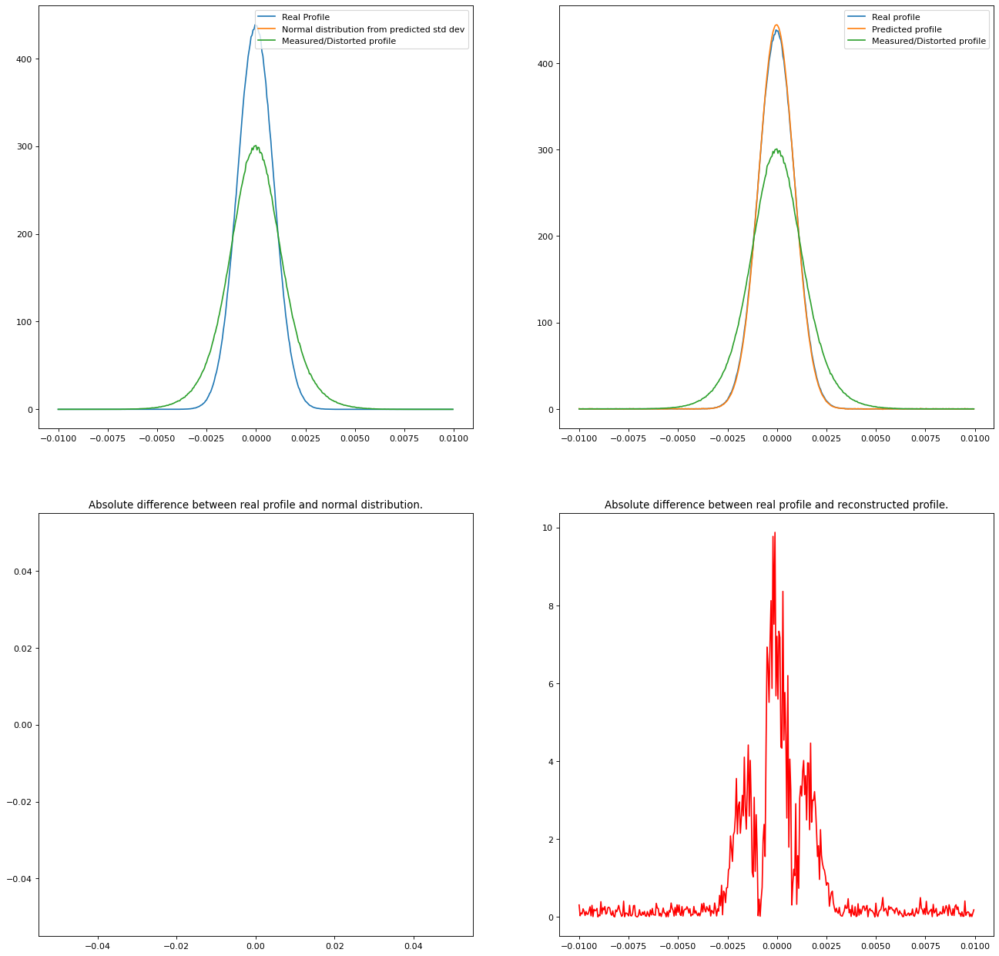

In [58]:
modelUtils.plot_example_recon(0, bin_width, X, y_test_profile, y_pred_profile, y_pred_stddev)

Mean of the manhat distance between real and recon via SD approach: 5.602572299210654
MSE between real and recon via SD approach: 162.7010157488766
Mean of the manhat distance between real and recon via FP approach: 0.5835408685340666
MSE between real and recon via FP approach: 0.6923459539353004


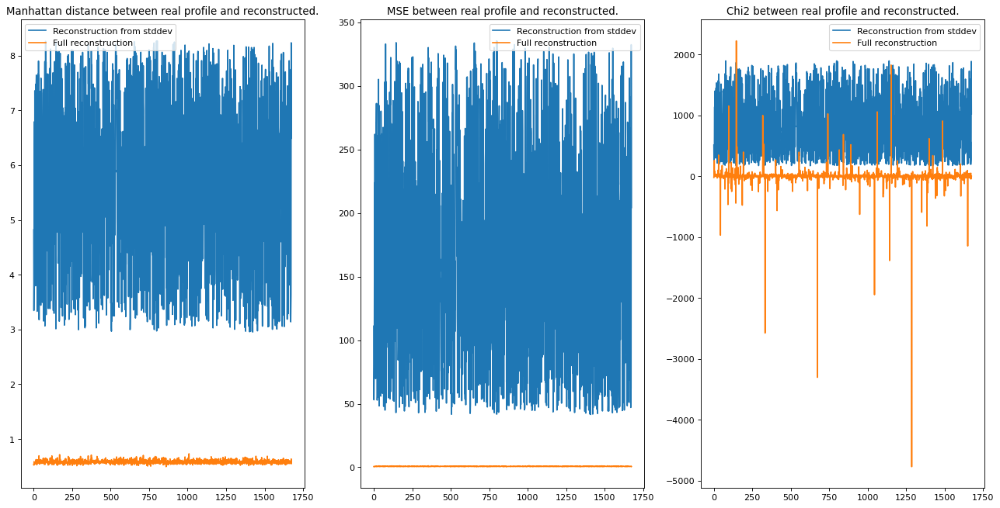

In [76]:
modelUtils.print_error_plots(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

In [77]:
df = modelUtils.generate_normal_dataframe(bin_width, y_pred_stddev)

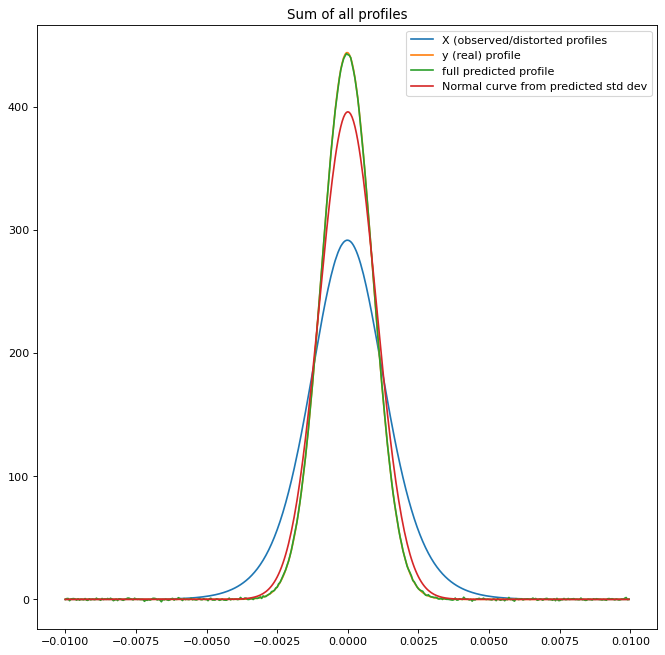

In [78]:
modelUtils.plot_sum(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

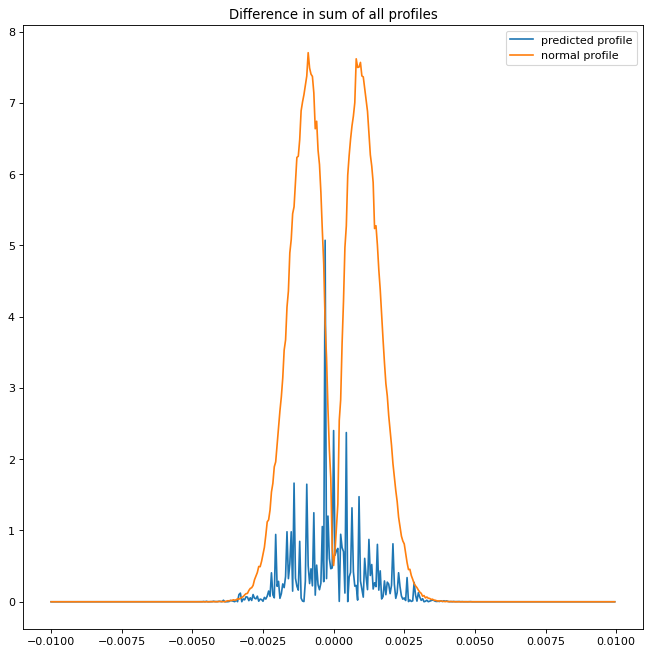

In [65]:
modelUtils.plot_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

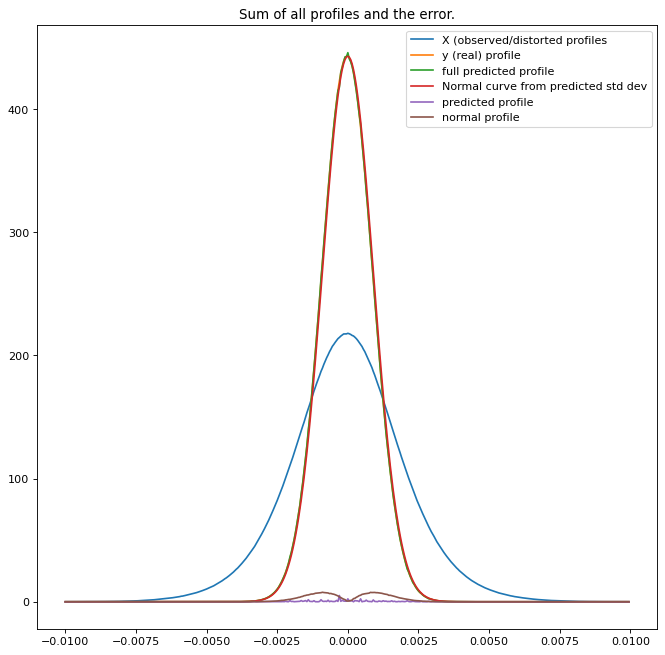

In [73]:
modelUtils.plot_sum_and_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

In [80]:
modelUtils.rate_model_sd(y_test_profile, y_pred_profile, regr_profile)
modelUtils.rate_model_sd(y_test_stddev*1e6, y_pred_stddev*1e6, regr_stddev)

                                    mean of residuals    std of residuals    r2 score       MSE
LinearRegression(normalize=True)             0.250007            0.573614    0.575065  0.391537
                                    mean of residuals    std of residuals    r2 score     MSE
LinearRegression(normalize=True)              3.62303             2.71599    0.976064  20.503


In [111]:
residuals, stddev_from_profile = modelUtils.get_all_errors(bin_width, y_test_stddev, y_pred_stddev, y_pred_profile)

       Real Std Dev    Predicted from profile    Predicted from stddev    Residual of FP approach    Residual of SD approach    Resdual squared FP approach    Residual squared SD approach
951         946.138                   943.042                  942.945                  3.09616                   3.19243                        9.58621                       10.1916
635         912.441                   913.009                  911.951                  0.567953                  0.490339                       0.322571                       0.240433
799         929.316                   925.099                  924.826                  4.2166                    4.49008                       17.7797                        20.1608
787         928.805                   925.936                  925.303                  2.86932                   3.50234                        8.23298                       12.2664
495         900.213                   903.218                  902.653        

Left plot below:
Pearsons R corr for SD approach: 0.9885029977589421
Spearman R corr for SD approach: 0.9867575409653496
Kendall Tau R corr for SD approach: 0.8993381405655969


Right plot below:
Pearsons R corr for FP approach: 0.9885820563995665
Spearman R corr for FP approach: 0.9865656864193882
Kendall Tau R corr for FP approach: 0.8992039800995024


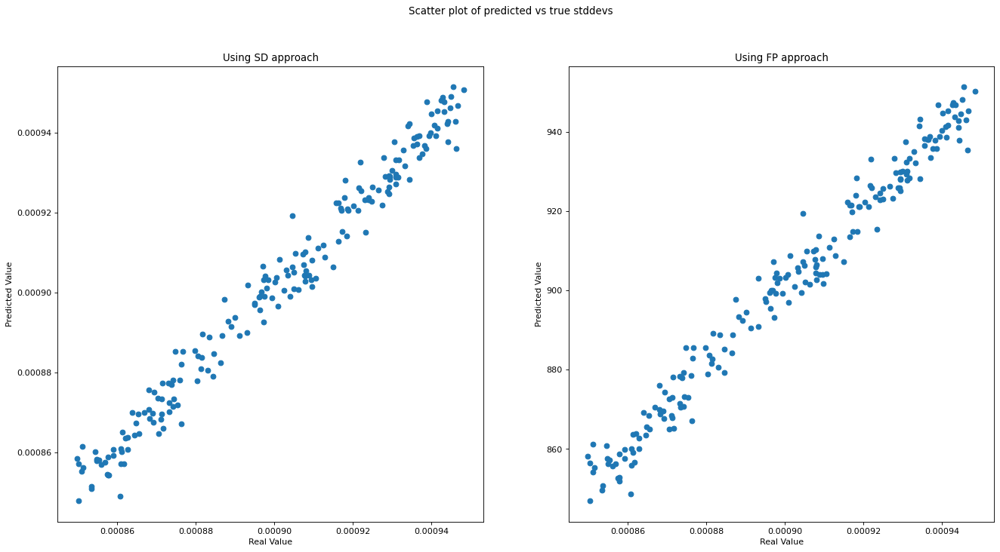

In [112]:
modelUtils.plot_scatters(y_test_stddev, y_pred_stddev, stddev_from_profile)

In [114]:
modelUtils.percent_errors(y_test_stddev, y_pred_stddev, stddev_from_profile)

Mean of percentage errors:
From SD    0.402302
From FP    0.397214
dtype: float64


Std dev of percentage errors:
From SD    0.302242
From FP    0.305964
dtype: float64


Max of percentage errors:
From SD    1.609210
From FP    1.623333
dtype: float64


Min of percentage errors:
From SD    0.000599
From FP    0.009619
dtype: float64


Here we are just plotting some stuff. May be useful in future.

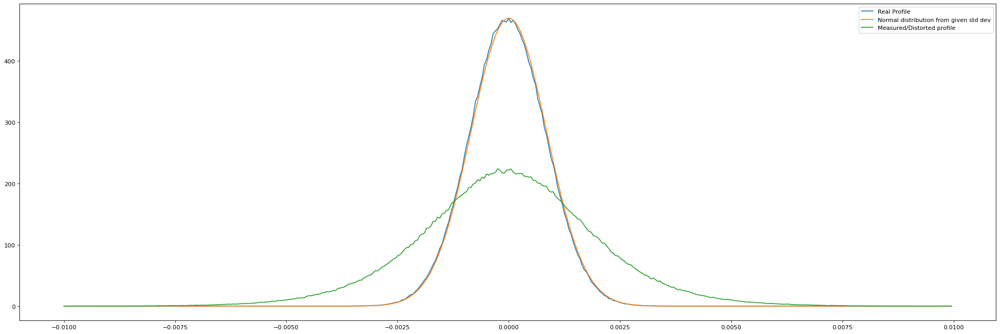

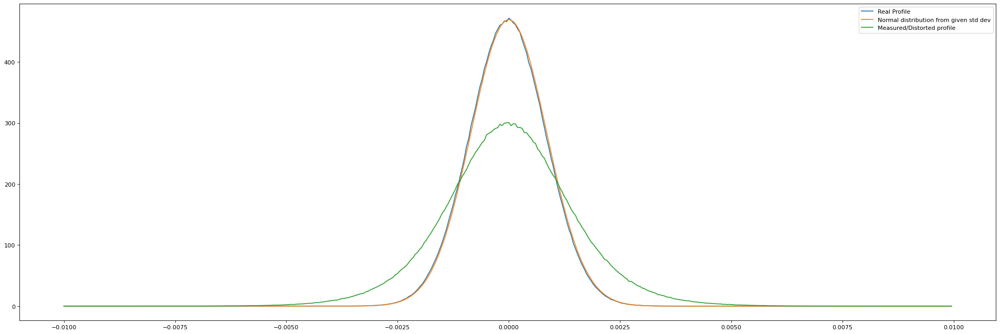

In [117]:
fileloc = '/eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD21x1mil/files/'
X, ystddev, yhists = modelUtils.load_from_pickle(fileloc, 'final', True)
modelUtils.plot_profile(X, ystddev, yhists, bin_width, 0)

fileloc = '/eos/user/l/lgolino/Documents/BIGroupAllWork/VIPMSims/TD20k0.01T/files/'
X, ystddev, yhists = modelUtils.load_from_pickle(fileloc, 'FirstAttempt', True)
modelUtils.plot_profile(X, ystddev, yhists, bin_width, 0)

In [112]:
append

'FirstAttempt'

## Parameterisation: Likely not to be used further

Everything below is an attempt to parameterise these curve with a q-Gaussian and feed into the models. This line of study was abandoned due to it requiring too many assumptions we don't have about the model.
The idea of parameterising your curve to account for lower statistics is similar to the problem of moving to a latent space and back, and is an interesting study BUT only in the case of the simulations for example. This wouldn't help with real data at all, hence why we abandoned it. It is kept here just in case it gets looked into again in future.

[ 3.32570805 -0.00982526  0.23989373]
0.004228911283357083
-1.1049043330288096e+52


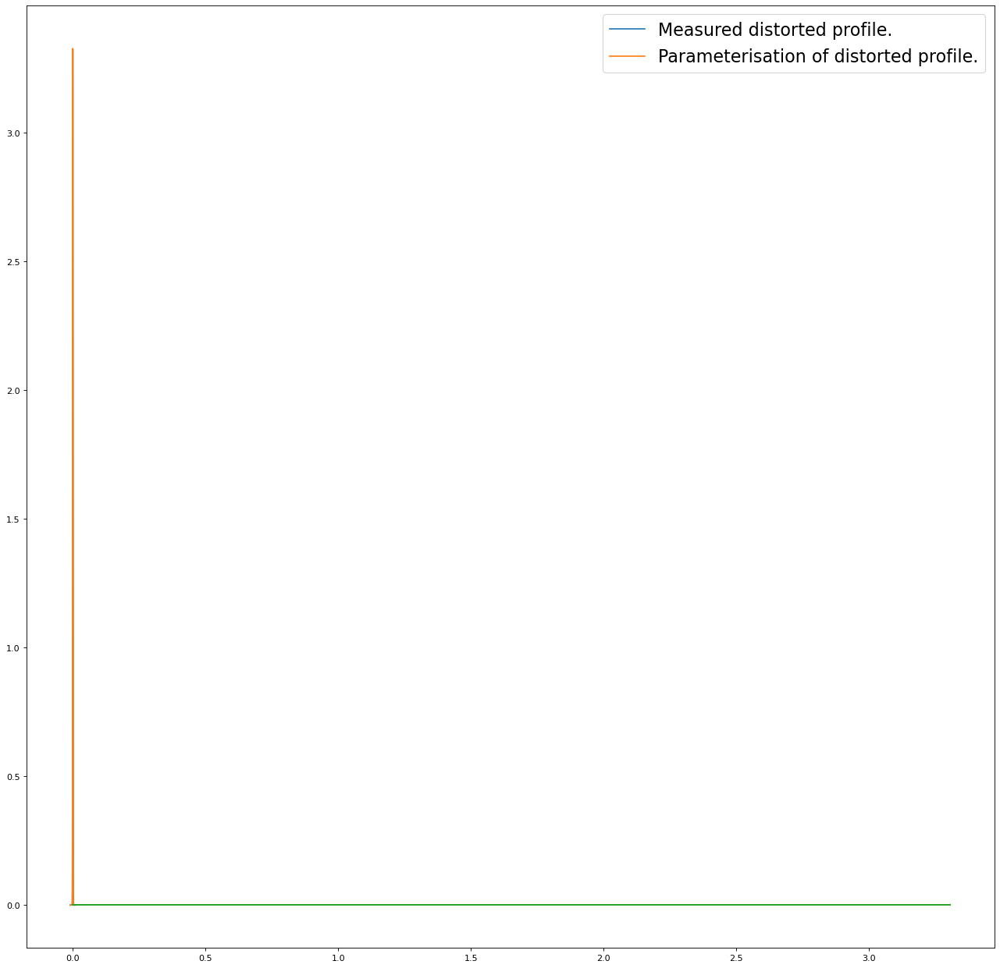

In [49]:
y_pred_profile
yhists

def fit_gaussian(x, y):
    popt, pcov = curve_fit(modelUtils.gaussian, x, y)
    return popt

def gaussian(x, a, mu, sigma):
    return a * np.exp(-(x - mu) ** 2 / (2 * sigma ** 2))


#popt, pcov = curve_fit(gaussian, xaxis_full, yhists.iloc[0], [1.2, 2, 2], bounds=([-100, 0, 0],[3, 100, 50]), method='dogbox')
popt, pcov = curve_fit(gaussian, xaxis_full, yhists.iloc[0])

print(popt)

plt.figure(figsize=(20, 20), dpi=80)
plt.plot(xaxis, gaussian(xaxis_full, *popt), label='Measured distorted profile.')
plt.plot(xaxis, yhists.iloc[0], label='Parameterisation of distorted profile.')
#plt.plot(xaxis, (abs(some_hists[0][m:n] - X.iloc[0][m:n])), label='Absolute difference.')
plt.legend(prop={'size': 20})

modelUtils.fit_gaussian(xaxis_full, yhists.iloc[0])

pd.DataFrame(y_pred_profile)

print(modelUtils.chi2(yhists.iloc[0], gaussian(xaxis_full, *modelUtils.fit_gaussian(xaxis_full, yhists.iloc[0]))))
print(modelUtils.chi2(pred_df.iloc[0], gaussian(xaxis, *modelUtils.fit_gaussian(xaxis, pred_df.iloc[0]))))

plt.plot(pred_df.iloc[0], gaussian(xaxis, *modelUtils.fit_gaussian(xaxis, pred_df.iloc[0])))

Chi2 =  0.0017853740892698371


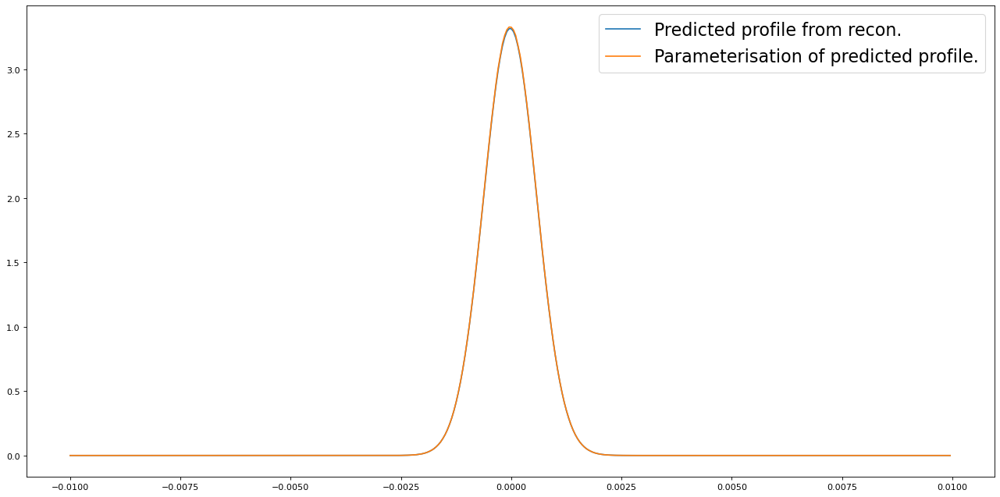

In [44]:
#for_comp = yhists.iloc[5]
for_comp = pred_df.iloc[10]

xaxis = np.arange(-0.01, 0.01, bin_width)
xaxis_full = np.arange(-4, 4, 0.02)

predchi2 = []
#realchi2 = []

for comparison in range(len(yhists)):
    pop = modelUtils.fit_gaussian(xaxis_full, pred_df.iloc[comparison])
    predchi2.append(modelUtils.chi2(pred_df.iloc[comparison], modelUtils.gaussian(xaxis_full, *pop)))
    
    
plt.figure(figsize=(20, 10), dpi=80)
plt.plot(xaxis, modelUtils.gaussian(xaxis_full, *pop), label='Predicted profile from recon.')
plt.plot(xaxis, for_comp, label='Parameterisation of predicted profile.')
plt.legend(prop={'size': 20})

print('Chi2 = ', modelUtils.chi2(for_comp, modelUtils.gaussian(xaxis_full, *pop)))



In [62]:
print(np.mean(predchi2))

0.0006330845528331672


In [51]:
from scipy.optimize import curve_fit
import scipy

def fitfunc(xl, q, beta, scale):
    return modelUtils.qgauss(xl, q, beta)*scale


some_hists = []
for i in range(0,20):
    fitme = X.iloc[i]
    xaxis = np.arange(-0.01, 0.01, bin_width)
    xaxis_full = np.arange(-4, 4, 0.02)

    #mask = ~((fitme == 0) & (xaxis_full))
    #fitme, xaxis_4 = fitme[mask], xaxis_full[mask]

    popt, pcov = curve_fit(fitfunc, xaxis_full, fitme, [1.2, 2, 2], bounds=([-100, 0, 0],[3, 100, 50]), method='dogbox')

    #plt.plot(xaxis_4, fitfunc(xaxis_4, *popt), 'r-')
    #plt.plot(xaxis_4, fitme)
    
    init_hist = fitfunc(xaxis_full, *popt)
    mask = ~((fitme == 0))
    
    histo = init_hist*mask

    some_hists.append(histo)
    print(popt)

[1.30708973 1.4155579  2.013093  ]
[1.31591917 1.44826952 2.0141726 ]
[1.33145412 1.52307139 2.01596856]
[1.35214839 1.64683347 2.01800743]
[1.37542654 1.81913201 2.02052564]
[1.38813296 2.01395526 2.02111591]
[1.39952913 2.24839049 2.02158992]
[1.38885261 2.45642747 2.01896229]
[1.38030094 2.70602718 2.01741457]
[1.36501863 2.94565296 2.01544575]
[1.33789154 3.16931644 2.01206494]
[1.31659975 3.41508958 2.01045068]
[1.28479659 3.62673949 2.00738834]
[1.26126069 3.88954912 2.00572967]
[1.23798897 4.1490425  2.00485274]
[1.20796617 4.38265238 2.00320595]
[1.18160575 4.64827999 2.00239709]
[1.15058095 4.9257452  2.00100197]
[1.12412261 5.2416967  2.0007946 ]
[1.09714201 5.6128404  2.00057093]


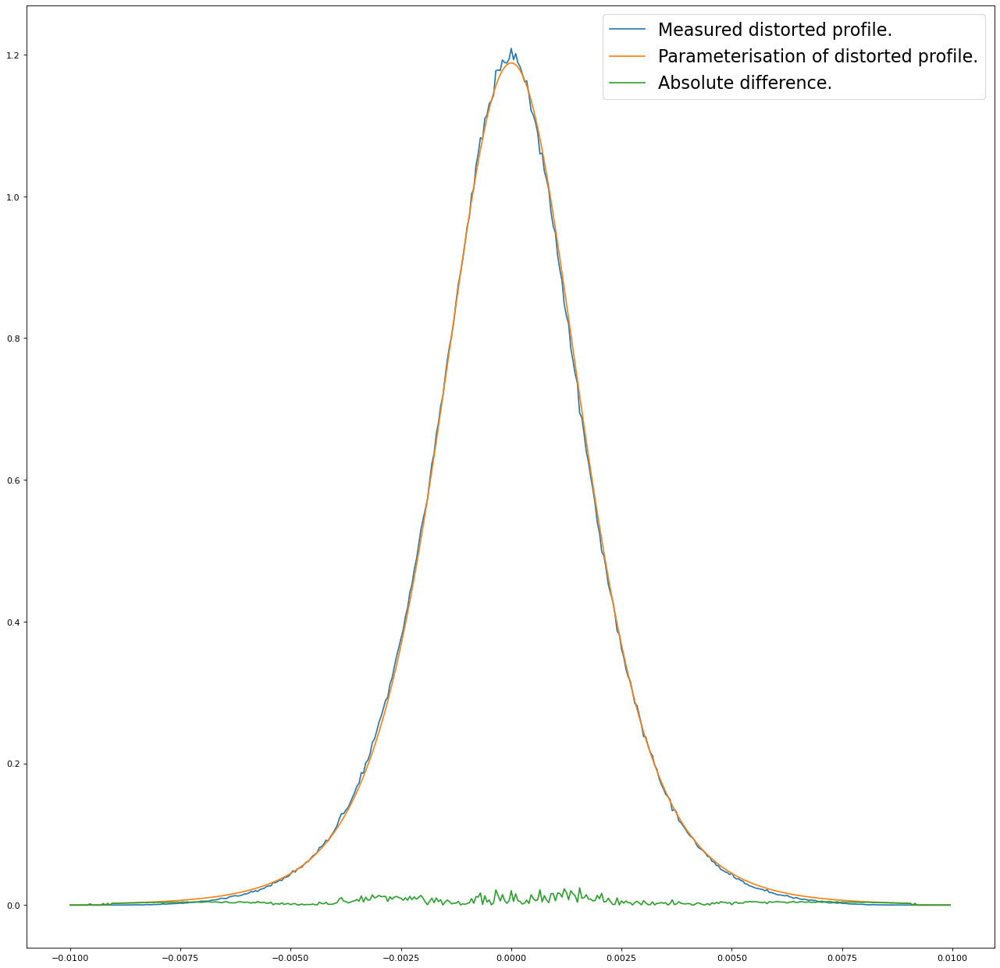

In [52]:
some_hists[0], X.iloc[0]
m = 0
n=400

plt.figure(figsize=(20, 20), dpi=80)
plt.plot(xaxis[m:n], X.iloc[0][m:n], label='Measured distorted profile.')
plt.plot(xaxis[m:n], some_hists[0][m:n], label='Parameterisation of distorted profile.')
plt.plot(xaxis[m:n], (abs(some_hists[0][m:n] - X.iloc[0][m:n])), label='Absolute difference.')
plt.legend(prop={'size': 20})

/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

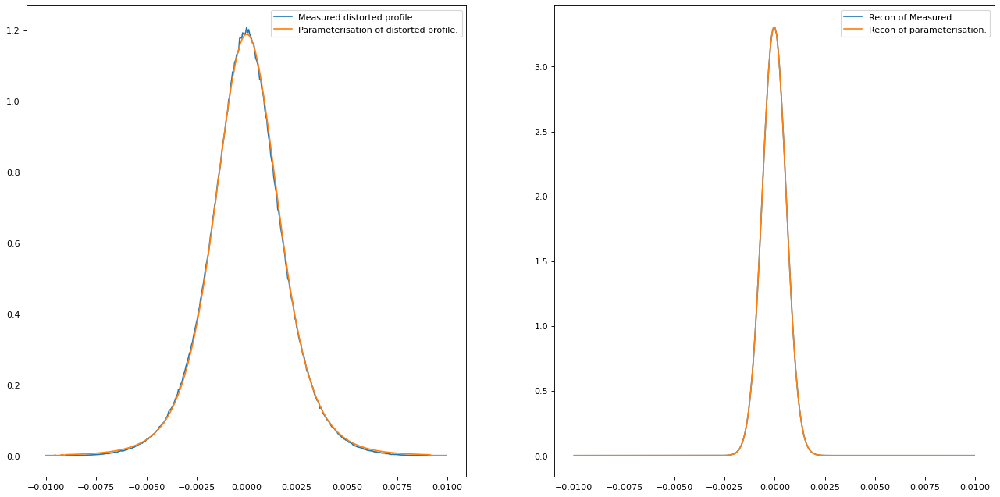

In [53]:
y_pred_stddev_1 = regr_stddev.predict(X.iloc[0:1])
y_pred_stddev_1
y_pred_profile_1 = regr_profile.predict(X.iloc[0:1])
y_pred_profile_1

y_pred_stddev_2 = regr_stddev.predict(pd.DataFrame(some_hists))
y_pred_stddev_2
y_pred_profile_2 = regr_profile.predict(pd.DataFrame(some_hists))
y_pred_profile_2


fig, axs = plt.subplots(1, 2, figsize=(20, 10), dpi=80)
axs[0].plot(xaxis, X.iloc[0], label='Measured distorted profile.')
axs[0].plot(xaxis, pd.DataFrame(some_hists).iloc[0], label='Parameterisation of distorted profile.')
axs[0].legend()

axs[1].plot(xaxis, y_pred_profile_1[0], label='Recon of Measured.')
axs[1].plot(xaxis, y_pred_profile_2[0], label='Recon of parameterisation.')
axs[1].legend()

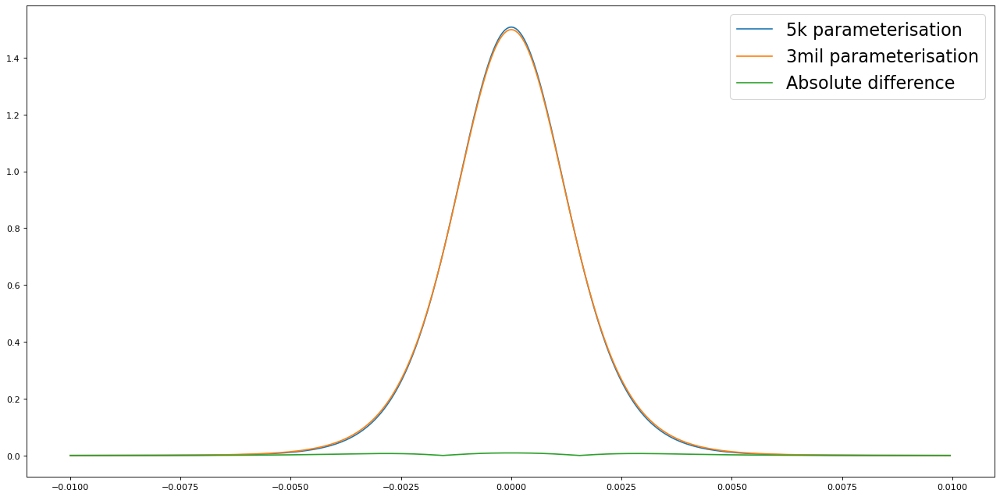

In [54]:
plt.figure(figsize=(20, 10), dpi=80)
plt.plot(xaxis, fitfunc(xaxis_full, 1.20373084, 2.11119835, 1.99647672), label='5k parameterisation')
plt.plot(xaxis, fitfunc(xaxis_full, 1.22667415, 2.11142283, 2.00444382), label='3mil parameterisation')
plt.plot(xaxis, abs(fitfunc(xaxis_full, 1.20373084, 2.11119835, 1.99647672) - fitfunc(xaxis_full, 1.22667415, 2.11142283, 2.00444382)), label='Absolute difference')
plt.legend(prop={'size': 20})

In [55]:
pd.DataFrame(some_hists)
#X
(some_hists[0] - X.iloc[0]).sum()

0.48213780652270105

So now lets test on these new histograms.

In [58]:
predictme =  np.array(pd.DataFrame(some_hists).iloc[0:1])
useme = np.array(X.iloc[0])

    
    
mask = ~((useme == 0))
#predictme[mask==True] = 0
predictme = predictme*mask

/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

SD: Manhattan distance between plots =  1.6650556895172661
SD: MS distance between plots =  20.69068199064519
SD: Chi2 goodness of fit: 35.08976948402296


FP: Manhattan distance between plots =  0.16188813752094802
FP: MS distance between plots =  0.26940806668093964
FP: Chi2 goodness of fit: 0.6724859208610232
Mean of the manhat distance between real and recon via SD approach: 1.6715609540642042
MSE between real and recon via SD approach: 20.802606795837015
Mean of the manhat distance between real and recon via FP approach: 0.1701032038334705
MSE between real and recon via FP approach: 0.29590421690115365
                                                                         mean of residuals    std of residuals    r2 score      MSE
KernelRidge(alpha=0.01, coef0=1, degree=2, gamma=None, kernel='poly',              1.58166            0.965284     -97.955  3.43343
            kernel_params=None)
                                                                         mean of residual

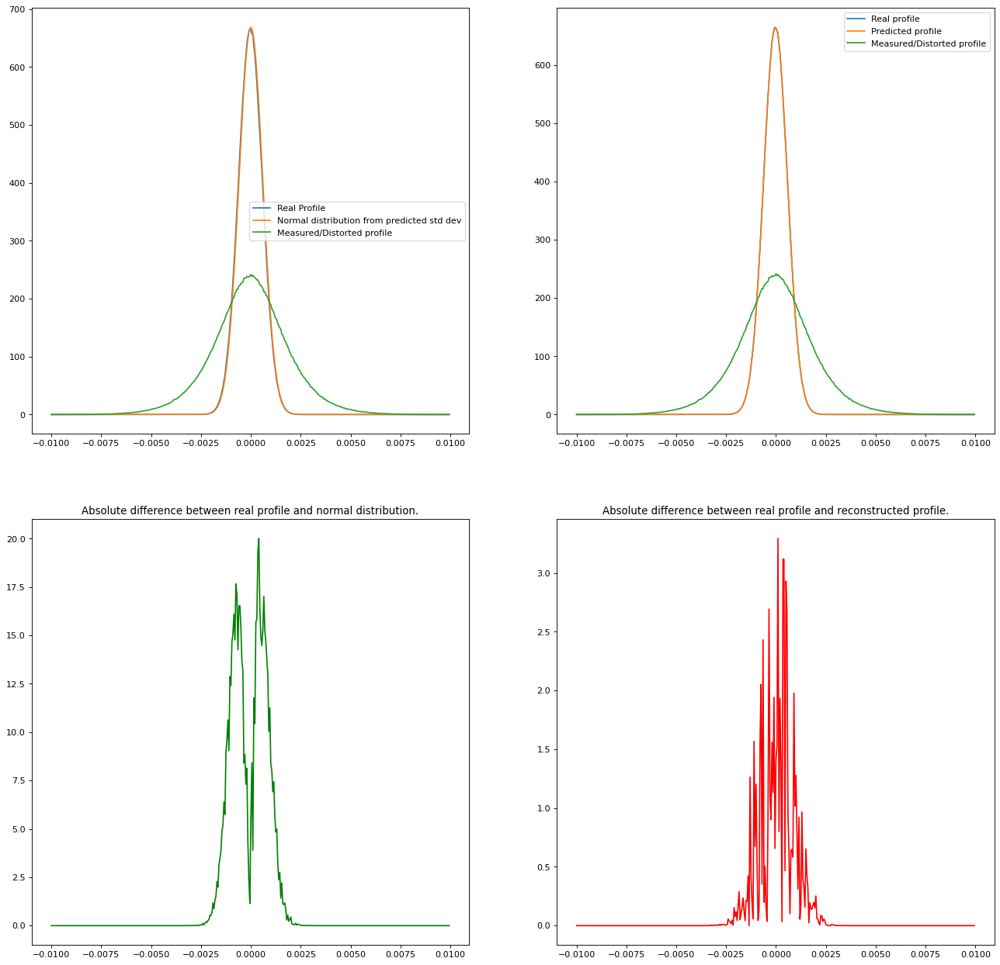

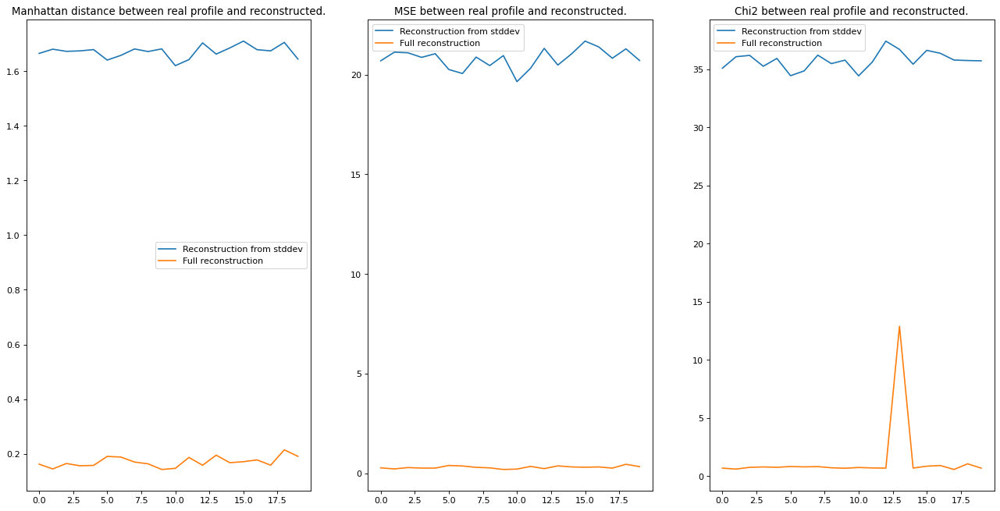

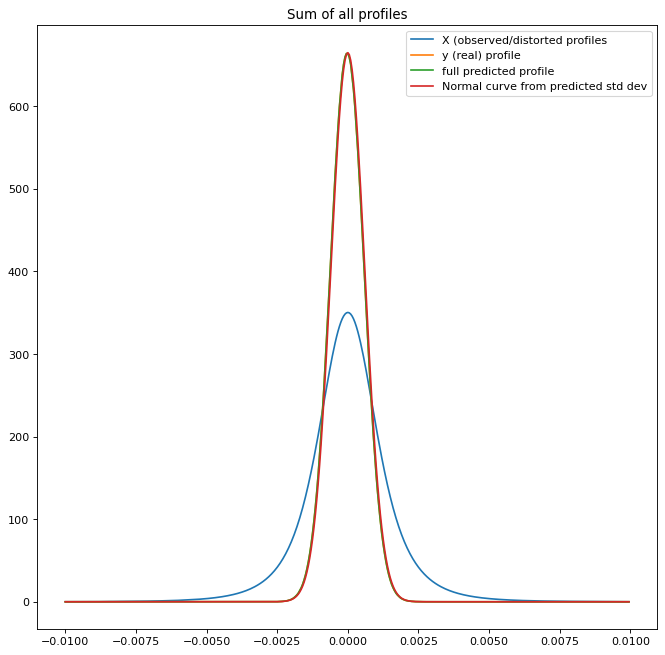

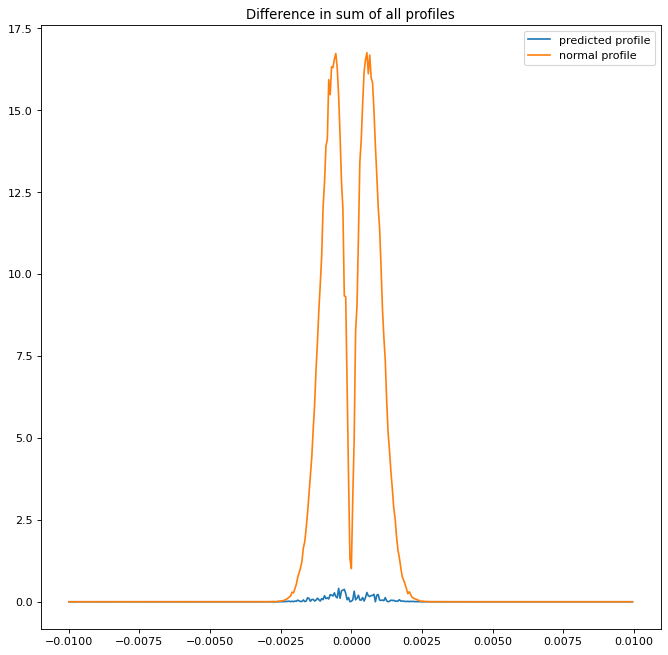

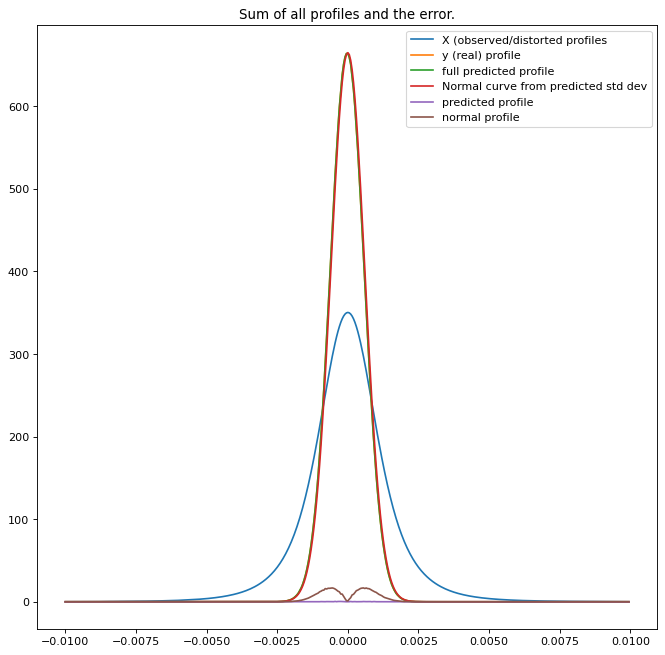

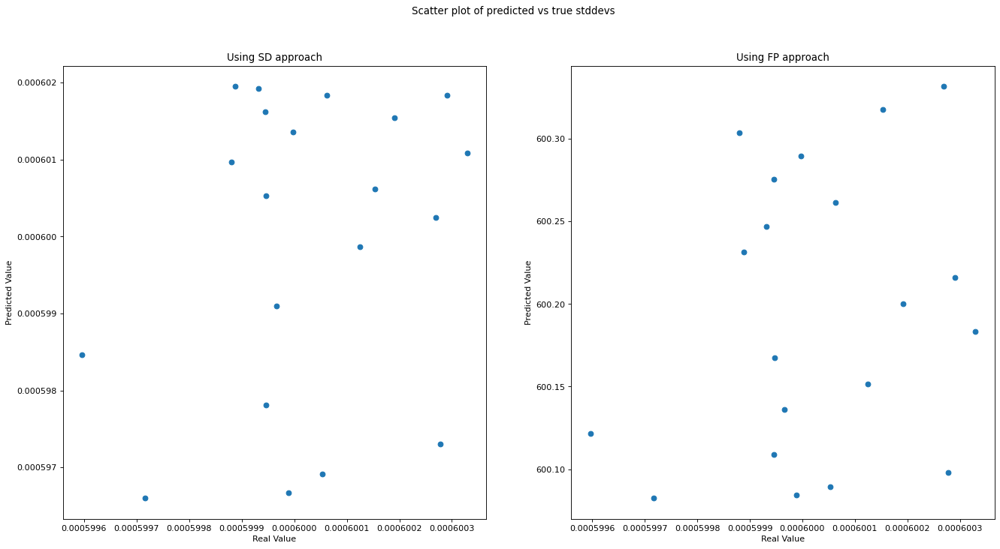

In [59]:
X_test = pd.DataFrame(some_hists)
y_test_stddev = ystddev[0:20]
y_test_profile = yhists[0:20]
#y_train_profile # Just to see
# Create linear regression object and train on stddevs.
# Model 1
regr_stddev = model_stddev
y_pred_stddev = regr_stddev.predict(X_test)
# Create linear regression object and train on full profile.
# Model 2
regr_profile = model_profile
y_pred_profile = regr_profile.predict(X_test)

#Print metrics of each model.
#modelUtils.print_model_metrics(X_train, y_train_stddev, X_test, y_test_stddev, regr_stddev)
#modelUtils.print_model_metrics(X_train, y_train_profile, X_test, y_test_profile, regr_profile)

#Plot an example (index 10)
modelUtils.plot_example_recon(0, bin_width, X, y_test_profile, y_pred_profile, y_pred_stddev)

#Show the MSE, Manhat, and Chi2
modelUtils.print_error_plots(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

#Generate dataframe of normal profiles.
df = modelUtils.generate_normal_dataframe(bin_width, y_pred_stddev)

#Plot sums and sum of errors.
modelUtils.plot_sum(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)
modelUtils.plot_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)
modelUtils.plot_sum_and_errors(bin_width, X_test, y_test_profile, y_pred_profile, y_pred_stddev)

#Rate model in format of copied paper.
modelUtils.rate_model_sd(y_test_stddev*1e6, y_pred_stddev*1e6, regr_stddev)
modelUtils.rate_model_sd(y_test_profile, y_pred_profile, regr_profile)

#Get residual dataframe.
residuals, stddev_from_profile = modelUtils.get_all_errors(bin_width, y_test_stddev, y_pred_stddev, y_pred_profile)
all_residuals.append(residuals)

#Plot scatter of predictions
modelUtils.plot_scatters(y_test_stddev, y_pred_stddev, stddev_from_profile)

#Find % errors.
percents = modelUtils.percent_errors(y_test_stddev, y_pred_stddev, stddev_from_profile)
all_percents.append(percents)

In [60]:
y_pred_stddev_1 = regr_stddev.predict(X.iloc[0:1])
y_pred_stddev_1
y_pred_profile_1 = regr_profile.predict(X.iloc[0:1])
y_pred_profile_1

y_pred_stddev_2 = regr_stddev.predict(pd.DataFrame(predictme).iloc[0:1])
y_pred_stddev_2
y_pred_profile_2 = regr_profile.predict(pd.DataFrame(predictme).iloc[0:1])
y_pred_profile_2


(pd.DataFrame(predictme).iloc[0]-X.iloc[0]).sum()
(y_pred_profile_1-y_pred_profile_2).sum()



/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/cvmfs/sft.cern.ch/lcg/views/LCG_100_nxcals/x86_64-centos7-gcc9-opt/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-n

0.023870982466027216

#### ========================

L. GOLINO

lgolino@cern.ch

166064